# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine

Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
%matplotlib inline
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster import hierarchy



In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['b','r','g','c','m','y','k','#00EEEE','#A9A9A9','#FF8C00','#68228B']  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



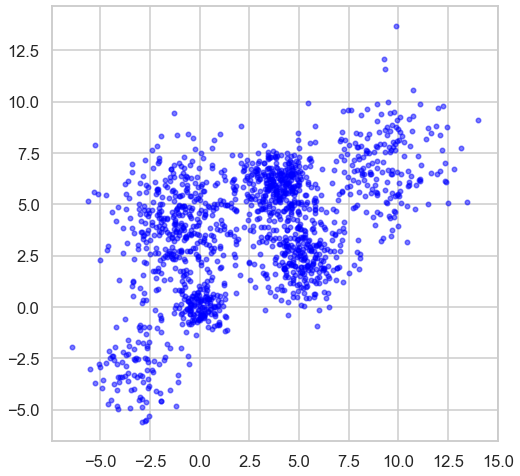

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [5]:
def kmeansfunc(data,k):
    kmeans = KMeans(n_clusters=k)
    km=kmeans.fit(data)
    plt.figure()
    display_cluster(data,km,k)
    
    
    
    
    

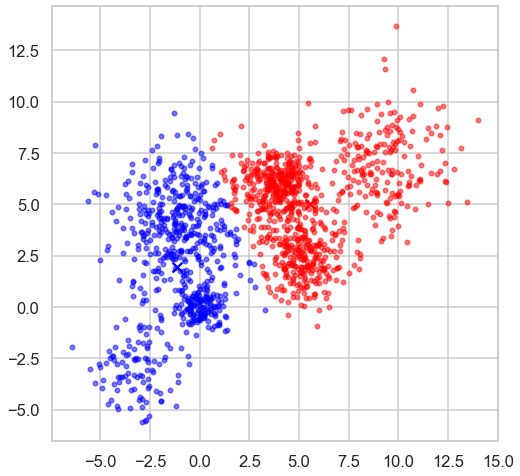

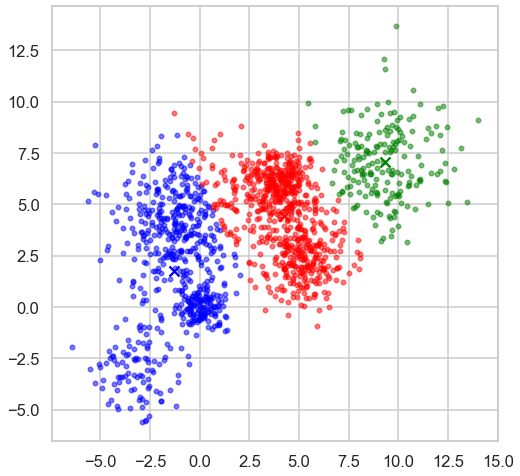

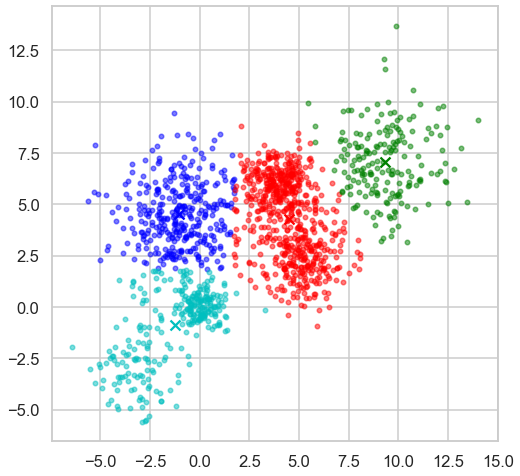

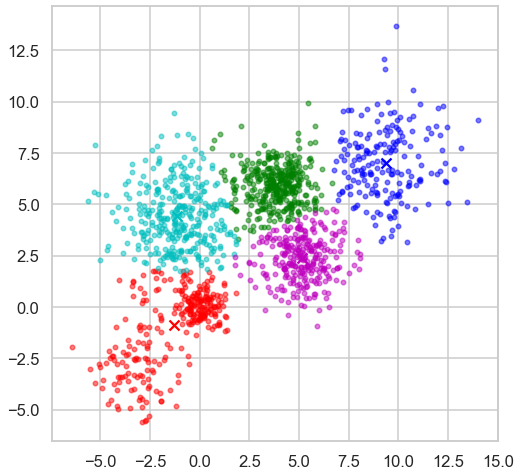

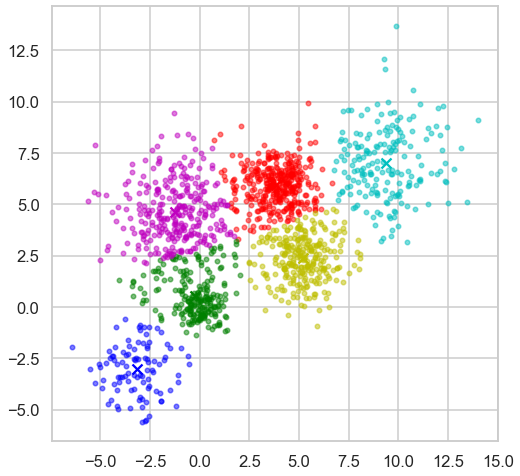

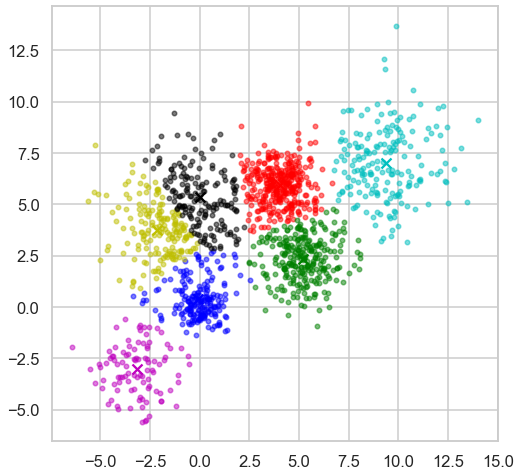

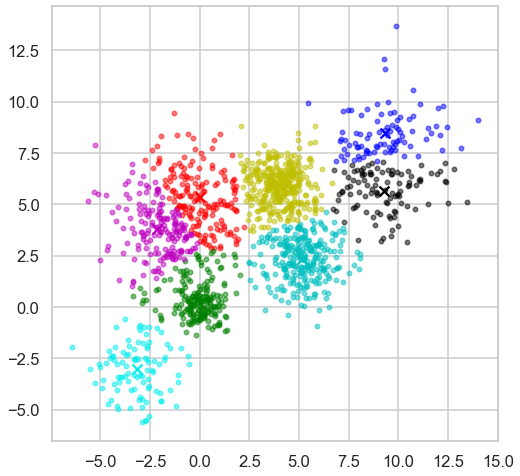

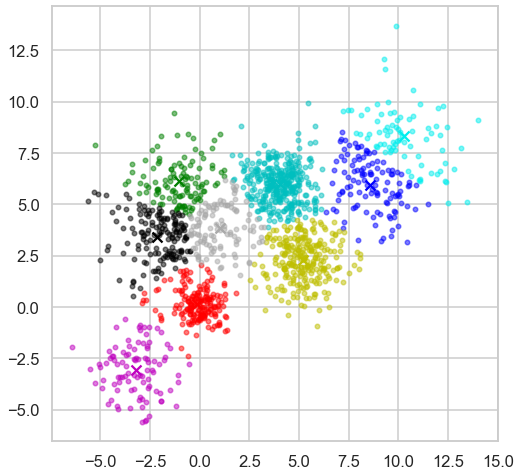

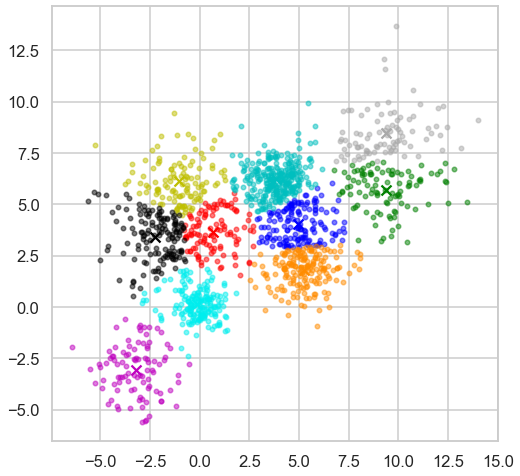

In [6]:
listofk=[2,3,4,5,6,7,8,9,10]
for i in listofk:
    kmeansfunc(Multi_blob_Data,i)

In [7]:
from scipy.spatial.distance import cdist
def elbow_K(data):
    # Plotting distortion function versus K and determining the approriate value of k
    distortions = []
    inertias = []
    mapping1 = {}
    mapping2 = {}
    K_rng = range(1,10)
    
    for k in K_rng:
        # Building and fitting the model
        kmeanModel = KMeans(n_clusters=k).fit(data)
        kmeanModel.fit(data)

        distortions.append(sum(np.min(cdist(data, kmeanModel.cluster_centers_,
                                'euclidean'), axis=1)) / data.shape[0])
        inertias.append(kmeanModel.inertia_)

        mapping1[k] = sum(np.min(cdist(data, kmeanModel.cluster_centers_,
                           'euclidean'), axis=1)) / data.shape[0]
        mapping2[k] = kmeanModel.inertia_

    plt.plot(K_rng, distortions, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method using Distortion')
    plt.show()

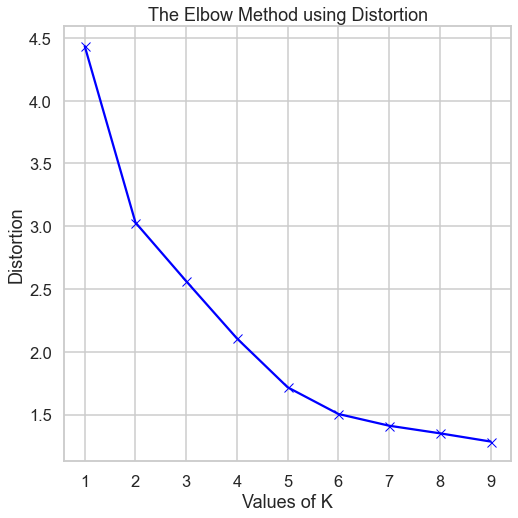

In [8]:
elbow_K(Multi_blob_Data)

6


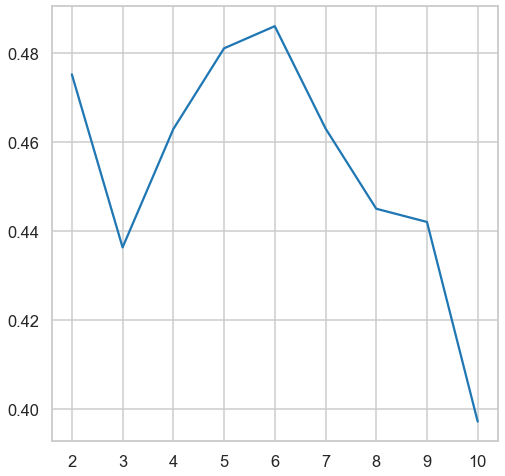

In [9]:
k=2
list=[]

while(k<=10):
    kmeans = KMeans(n_clusters=k)
    km=kmeans.fit(Multi_blob_Data)
    silhouette_avg = silhouette_score(Multi_blob_Data,km.labels_)
    list.append(silhouette_avg)
    k=k+1
z=[2,3,4,5,6,7,8,9,10]
plt.plot(z,list)
print(z[np.argmax(list)])


    

<BarContainer object of 9 artists>

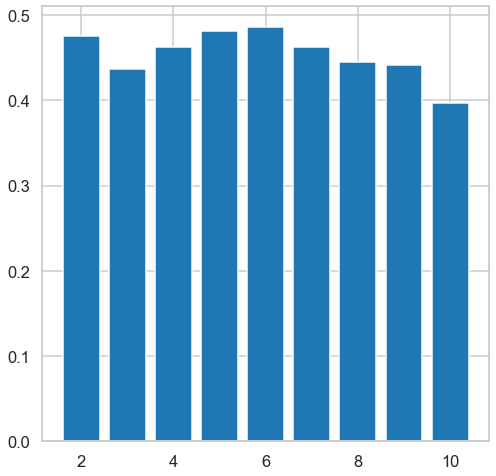

In [10]:
plt.bar(z, list)

In [11]:
kmeans = KMeans(n_clusters=6)
km=kmeans.fit(Multi_blob_Data)
silhouette_avg = silhouette_score(Multi_blob_Data,km.labels_)
silhouette_avg

0.48614459735646176

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average‘average’ uses the average of the distances of each observation of the two sets. and single:‘single’ uses the minimum of the distances between all observations of the two sets. )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

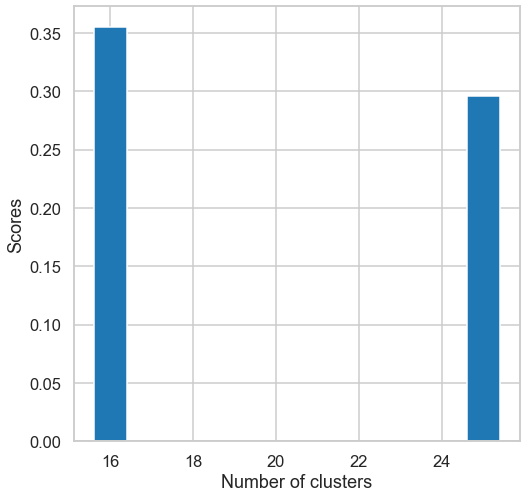

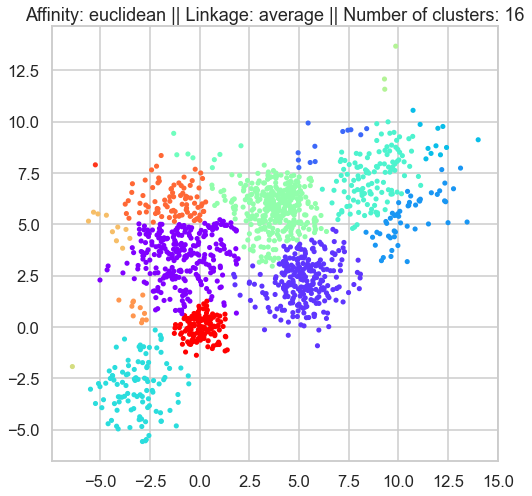

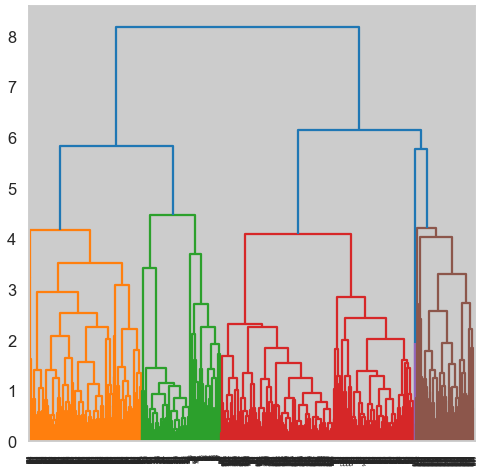

In [12]:
listofaffinity=['euclidean','manhattan','cosine']
listoflinkage=['average','single']
listn_cluser=[]
silhouette_scores= []
listofcombination=[]
for i in listofaffinity:
    for j in listoflinkage:
        agglo=AgglomerativeClustering(n_clusters =None,affinity=i,linkage=j,distance_threshold = 3, compute_full_tree =True).fit(Multi_blob_Data)
        listn_cluser.append(agglo.n_clusters_)
        listn_cluser.sort()
        
        while (listn_cluser.count(1)):
            listn_cluser.remove(1)

        if len(np.unique(agglo.labels_))>1:
            silhouette_scores.append(silhouette_score(Multi_blob_Data, agglo.labels_))
            listofcombination.append([agglo.affinity,agglo.linkage])
            
       


#         plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = agglo.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))
#         plt.show()

#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))

#         dindo=shc.linkage(Multi_blob_Data,j)
#         shc.dendrogram(dindo)
#         plt.show()
        
    

plt.bar(listn_cluser, silhouette_scores)
plt.xlabel('Number of clusters')
plt.ylabel('Scores')
plt.show()
x=np.argmax(silhouette_scores)
bestcombinantion=listofcombination[x]
agglo_best=AgglomerativeClustering(n_clusters =None,affinity=bestcombinantion[0],linkage=bestcombinantion[1],distance_threshold = 3, compute_full_tree =True).fit(Multi_blob_Data)
plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = agglo_best.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo_best.affinity,agglo_best.linkage,agglo_best.n_clusters_))
plt.show()
plt.figure()
dindo=shc.linkage(Multi_blob_Data,agglo_best.linkage)
shc.dendrogram(dindo)
plt.show()




    
            


### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

[2.1, 6]


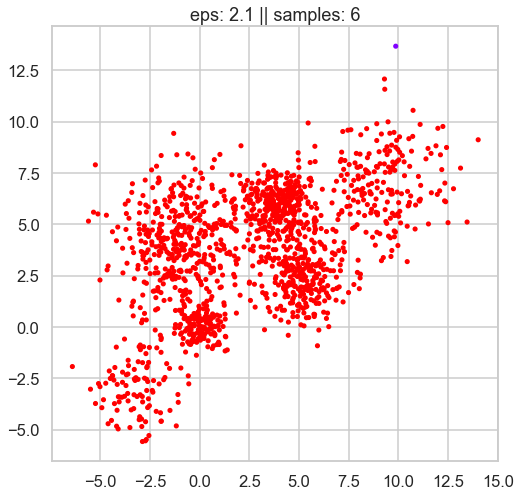

0.4685207355522043


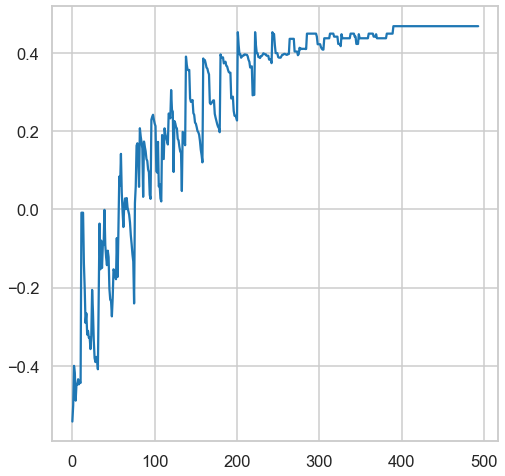

In [13]:
listofeps=np.arange(0.1,3.1,0.1)
listofsamp=np.arange(5,26,1)
silhouette_scores= []
list=[]
listofcombination=[]
for i in listofeps:
    for j in listofsamp:
        db=DBSCAN(eps=i, min_samples=j).fit(Multi_blob_Data)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        list.append(n_clusters_)
        if len(np.unique(labels))>1:
            np.array(silhouette_scores.append(silhouette_score(Multi_blob_Data,labels)))
            listofcombination.append([i,j])  
        
        
        


# print(len(listofcombination))
# print(len(silhouette_scores))
x=np.argmax(silhouette_scores)
bestcombinantion=listofcombination[x]
print(bestcombinantion)
db_best=DBSCAN(eps=bestcombinantion[0], min_samples=bestcombinantion[1]).fit(Multi_blob_Data)
plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = db_best.labels_, cmap ='rainbow',s =13)
plt.title("eps: {} || samples: {}".format(db_best.eps,db_best.min_samples))
plt.show()
plt.figure
plt.plot(range(0,len(silhouette_scores)),silhouette_scores)
max_score=max(silhouette_scores)
print(max_score)



        


### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

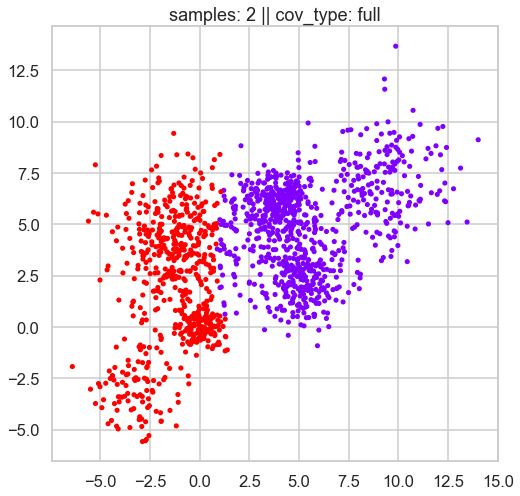

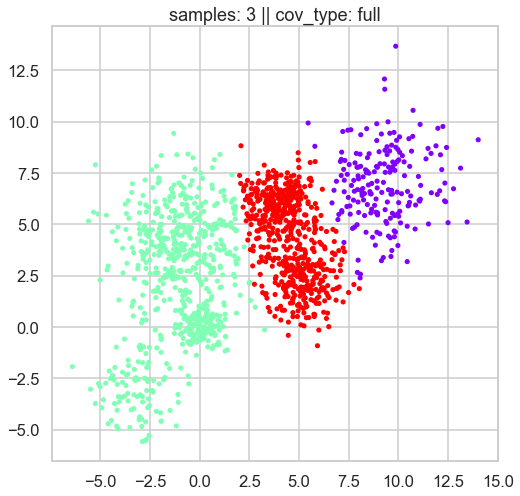

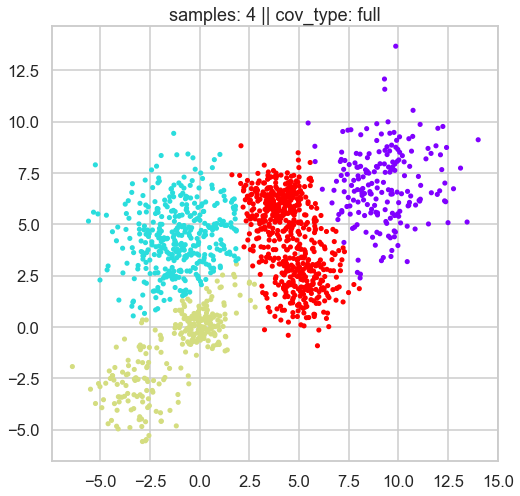

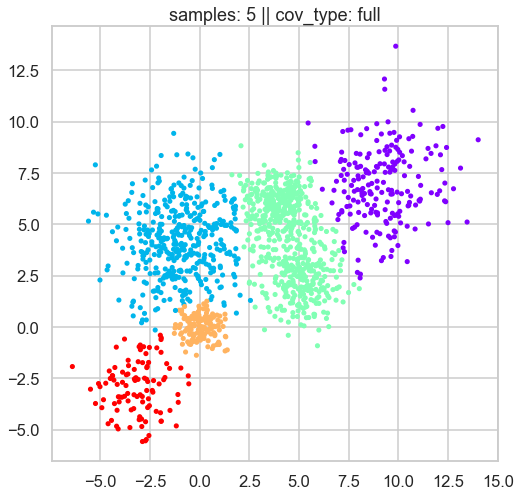

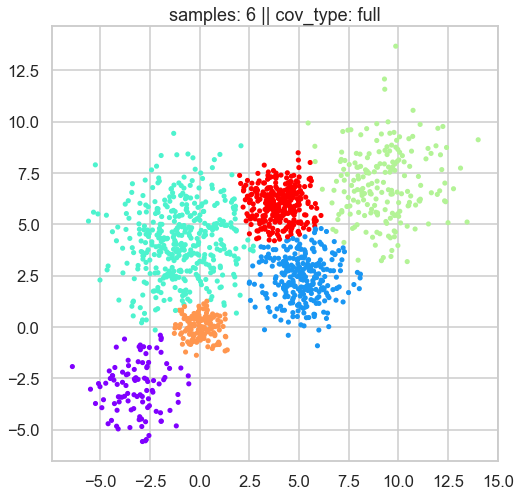

...

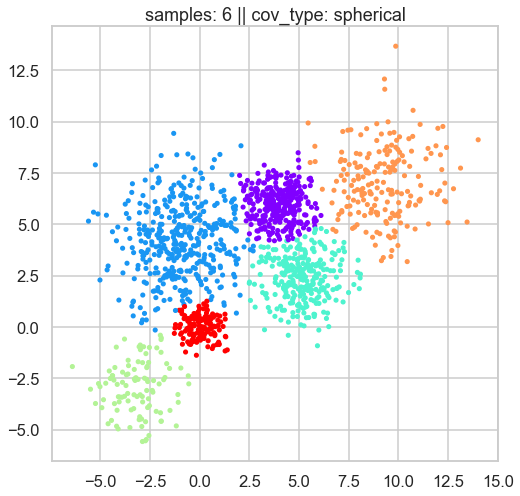

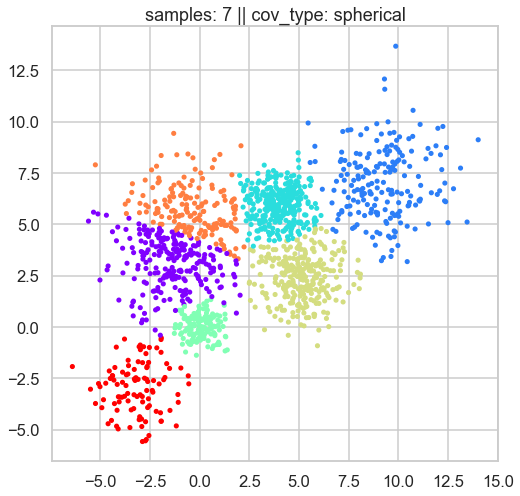

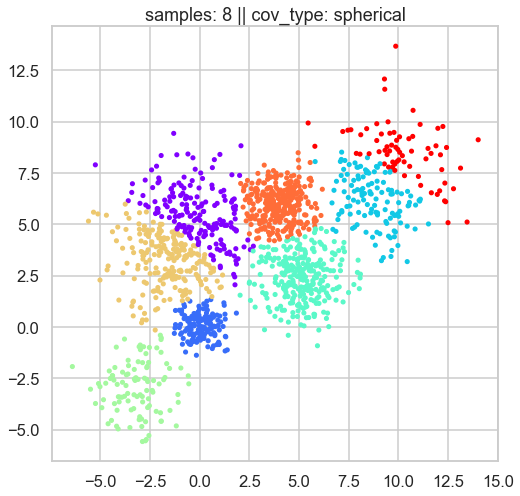

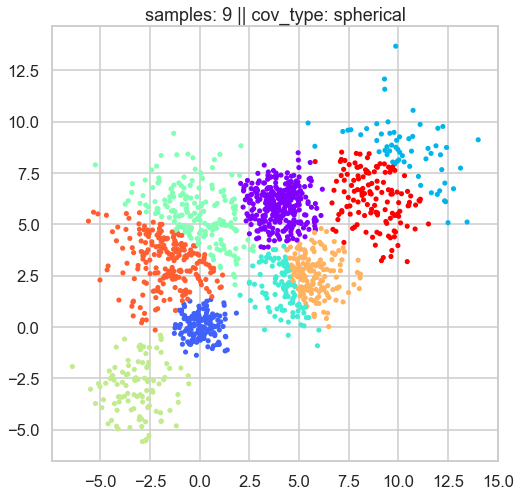

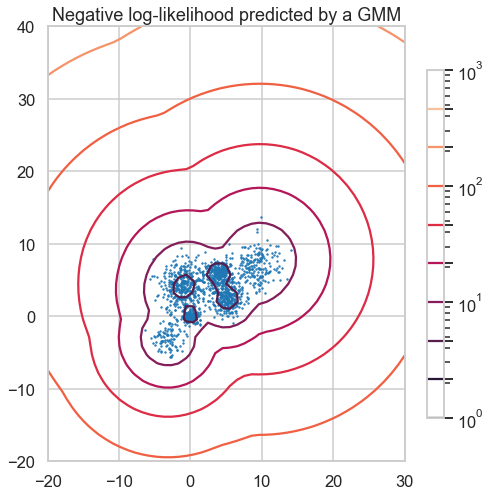

In [14]:
from matplotlib.colors import LogNorm
cov_types = ['full','tied','diag','spherical']
listofsamples=[2,3,4,5,6,7,8,9]
listofcov=[]
for i in cov_types:
    for j in listofsamples:
        gm=GaussianMixture(n_components=j,covariance_type=i).fit(Multi_blob_Data)
        probs=gm.predict_proba(Multi_blob_Data)
        listofcov.append(probs)
        plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = gm.predict(Multi_blob_Data), cmap ='rainbow',s =13)
        plt.title("samples: {} || cov_type: {}".format(gm.n_components,gm.covariance_type))
        plt.show()
        

x = np.linspace(-20.0, 30.0)
y = np.linspace(-20.0, 40.0)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -gm.score_samples(XX)
Z = Z.reshape(X.shape)

CS = plt.contour(
    X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10)
)
CB = plt.colorbar(CS, shrink=0.8, extend="both")
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], 0.8)

plt.title("Negative log-likelihood predicted by a GMM")
plt.axis("tight")
plt.show()

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


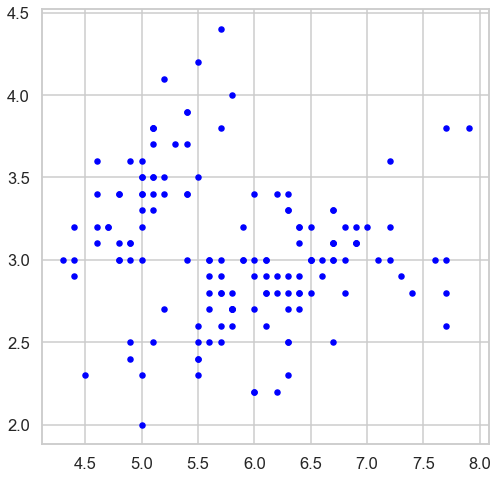

In [90]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
# array([0, 0, 1])
# ['setosa', 'versicolor', 'virginica']
iris_data.target_names
# 
df = pd.DataFrame(iris_data.data, columns = iris_data.feature_names)
# df2 = pd.DataFrame(iris_data.target_names[iris_data.target])
# df = pd.concat([df1, df2], axis = 1)
arr_df = np.array(df)

df_sp = df.filter(['sepal length (cm)','sepal width (cm)'], axis=1)
df_sp = df.rename(columns={"sepal length (cm)":0,'sepal width (cm)':1})

df_pt = df.filter(['petal length (cm)','petal width (cm)'], axis=1)
df_pt = df.rename(columns={"petal length (cm)":0,'petal width (cm)':1})
plt.scatter(arr_df[:,0], arr_df[:,1], c ='b',s=25)





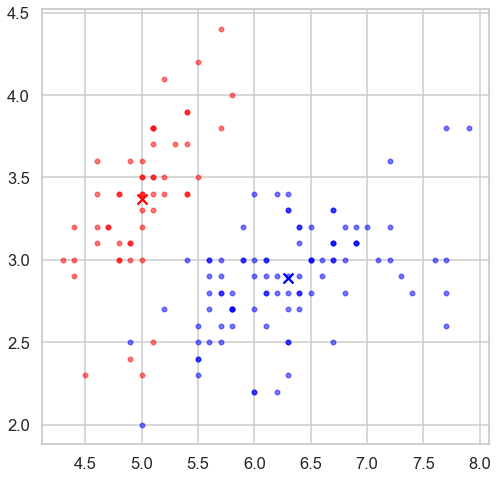

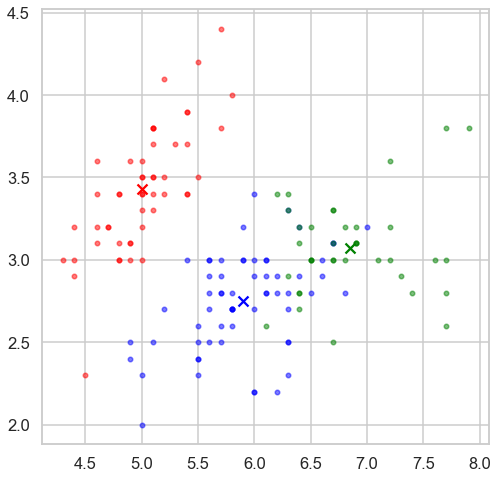

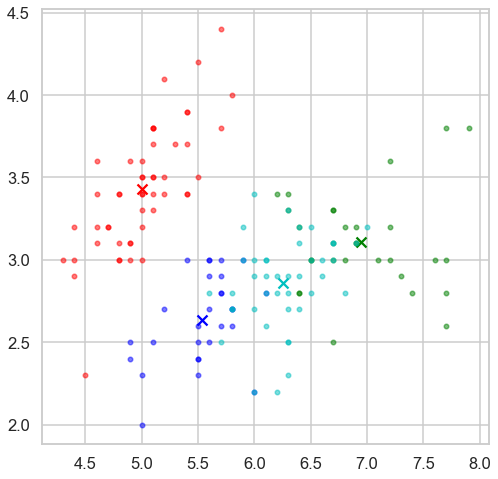

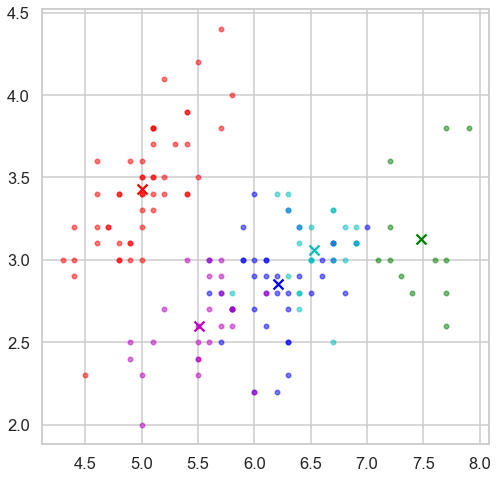

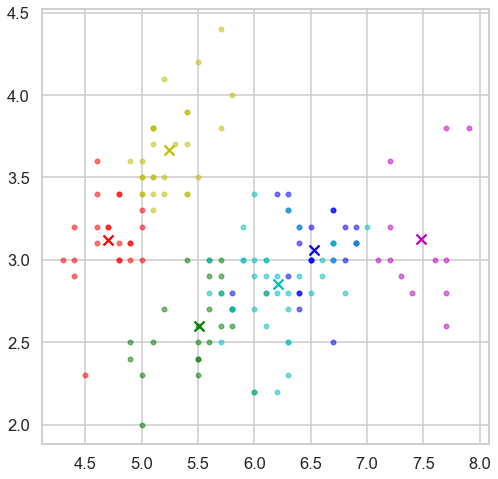

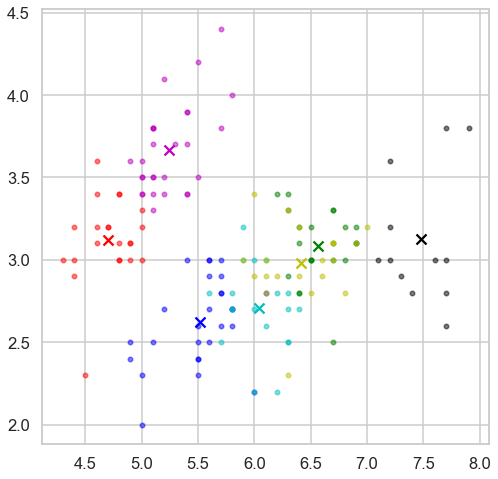

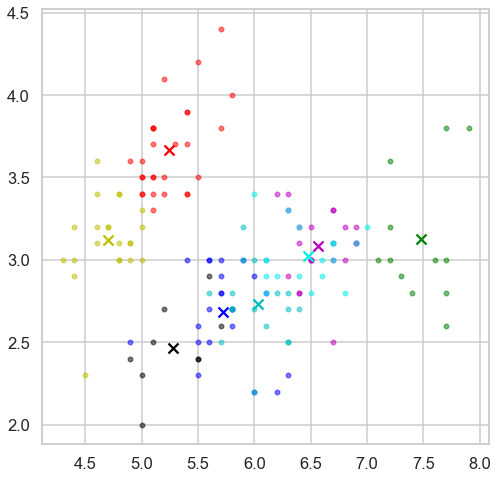

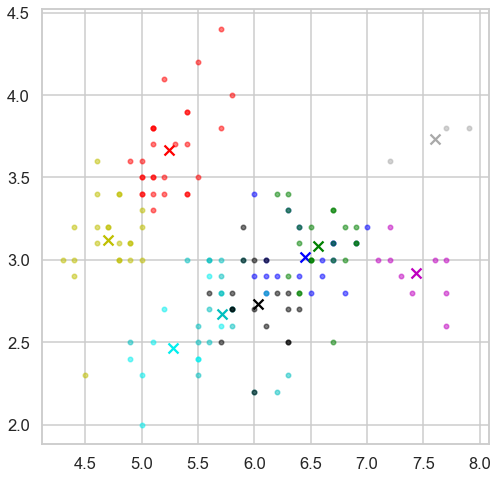

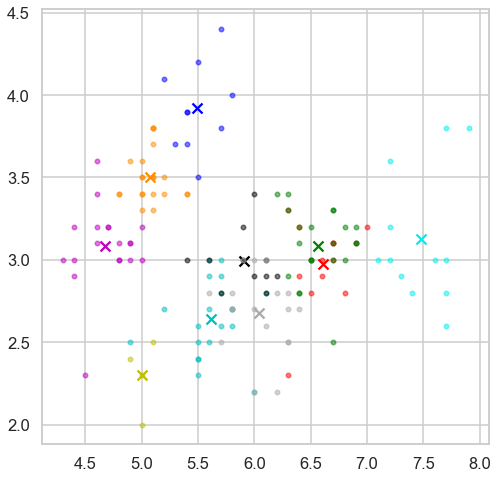

In [24]:
listofk=[2,3,4,5,6,7,8,9,10]
for i in listofk:
    kmeansfunc(arr_df,i)



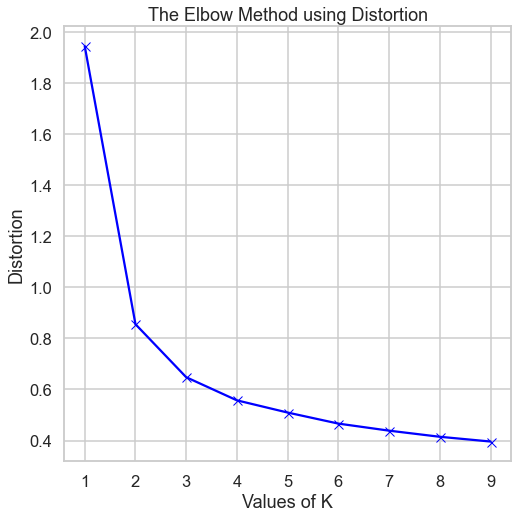

In [25]:
elbow_K(arr_df)  

5


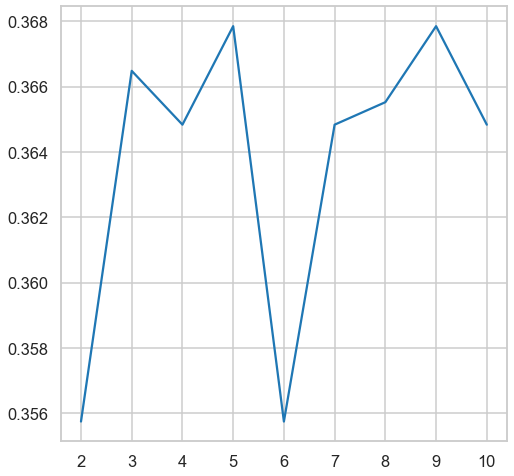

In [26]:
k=2
list_iris=[]

while(k<=10):
    kmeans_iris = KMeans(n_clusters=k)
    km_iris=kmeans.fit(arr_df)
    silhouette_avg_iris = silhouette_score(arr_df,km_iris.labels_)
    list_iris.append(silhouette_avg_iris)
    k=k+1
z_iris=[2,3,4,5,6,7,8,9,10]
plt.figure
plt.plot(z_iris,list_iris)
print(z_iris[np.argmax(list_iris)])


<BarContainer object of 9 artists>

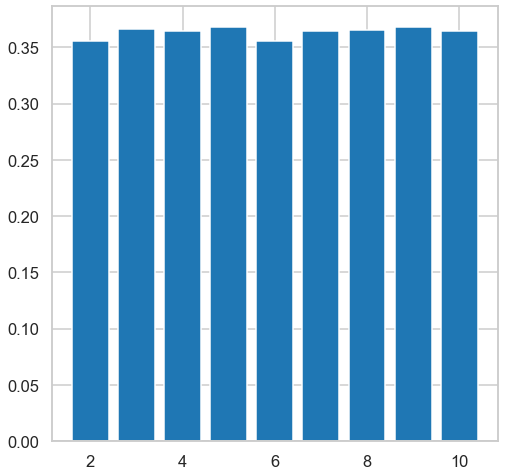

In [27]:
plt.figure
plt.bar(z_iris, list_iris)


# hirechery for iris data


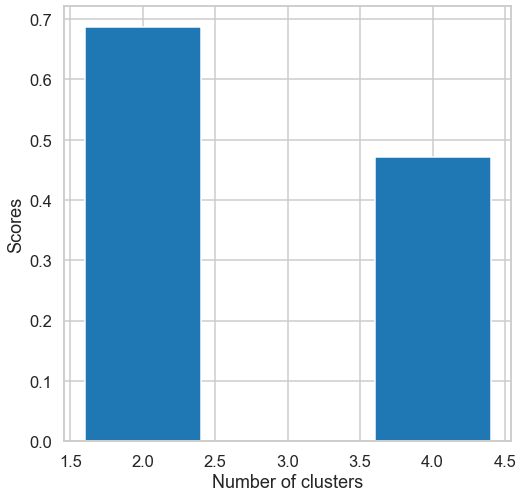

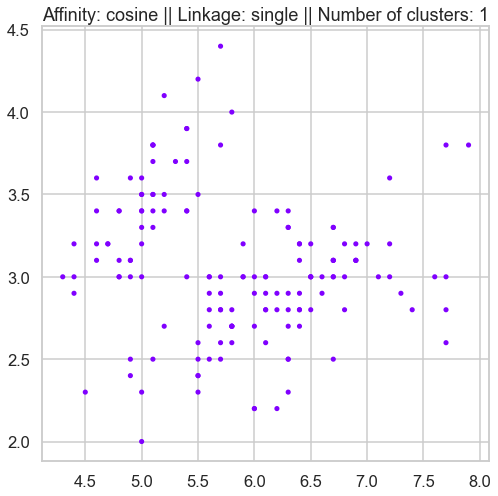

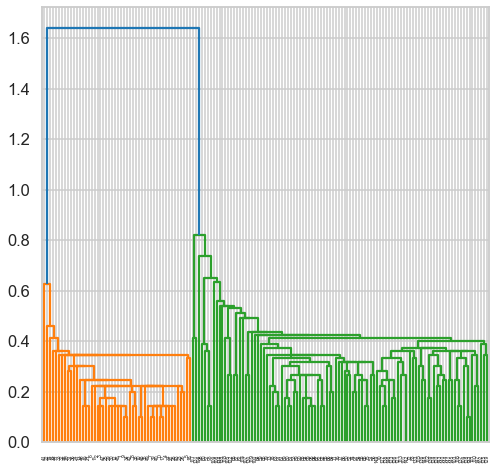

0.6867350732769776


In [28]:
listofaffinity_iris=['euclidean','manhattan','cosine']
listoflinkage_iris=['average','single']
listn_cluser_iris=[]
silhouette_scores_iris= []
listofcombination_iris=[]
for i in listofaffinity_iris:
    for j in listoflinkage_iris:
        agglo_iris=AgglomerativeClustering(n_clusters =None,affinity=i,linkage=j,distance_threshold = 3, compute_full_tree =True).fit(arr_df)
        listn_cluser_iris.append(agglo_iris.n_clusters_)
        listn_cluser_iris.sort()
        
        while (listn_cluser_iris.count(1)):
            listn_cluser_iris.remove(1)

        if len(np.unique(agglo_iris.labels_))>1:
            silhouette_scores_iris.append(silhouette_score(arr_df, agglo_iris.labels_))
            listofcombination_iris.append([agglo.affinity,agglo.linkage])
            
       


#         plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = agglo.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))
#         plt.show()

#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))

#         dindo=shc.linkage(Multi_blob_Data,j)
#         shc.dendrogram(dindo)
#         plt.show()
        
    

plt.bar(listn_cluser_iris, silhouette_scores_iris)
plt.xlabel('Number of clusters')
plt.ylabel('Scores')
plt.show()
x_iris=np.argmax(silhouette_scores_iris)
bestcombinantion_iris=listofcombination_iris[x_iris]
agglo_best_iris=AgglomerativeClustering(n_clusters =None,affinity=bestcombinantion_iris[0],linkage=bestcombinantion_iris[1],distance_threshold = 3, compute_full_tree =True).fit(arr_df)
plt.scatter(arr_df[:,0], arr_df[:,1], c = agglo_best_iris.fit_predict(arr_df), cmap ='rainbow',s =13)
plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo_best_iris.affinity,agglo_best_iris.linkage,agglo_best_iris.n_clusters_))
plt.show()
plt.figure()
dindo_iris=shc.linkage(arr_df,agglo_best_iris.linkage)
shc.dendrogram(dindo_iris)
plt.show()
max_score_iris=max(silhouette_scores_iris)
print(max_score_iris)

## dbscan for iris data


[0.9, 5]


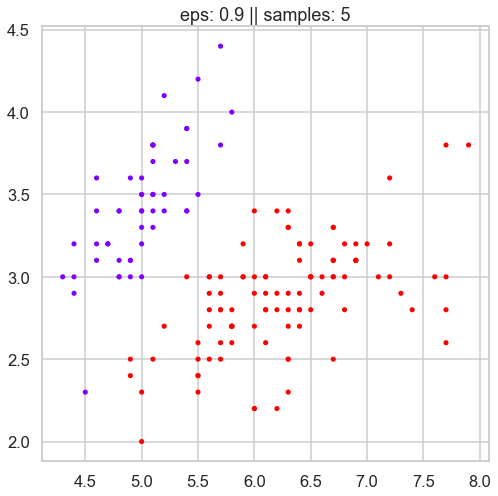

0.6867350732769776


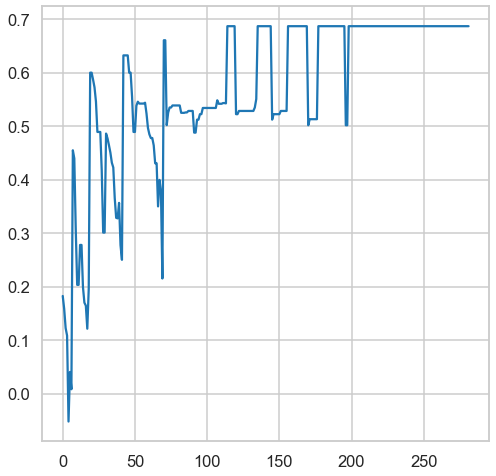

In [29]:
listofeps_iris=np.arange(0.1,3.1,0.1)
listofsamp_iris=np.arange(5,26,1)
silhouette_scores_iris_db= []
list_iris_db=[]
listofcombination_iris_db=[]
for i in listofeps_iris:
    for j in listofsamp_iris:
        db_iris=DBSCAN(eps=i, min_samples=j).fit(arr_df)
        labels_iris = db_iris.labels_
        n_clusters__iris = len(set(labels_iris)) - (1 if -1 in labels_iris else 0)
        list_iris_db.append(n_clusters__iris)
        if len(np.unique(labels_iris))>1:
            silhouette_scores_iris_db.append(silhouette_score(arr_df,db_iris.labels_))
            listofcombination_iris_db.append([i,j])  
        
        
        


# print(len(listofcombination))
# print(len(silhouette_scores))
x_iris_db=np.argmax(silhouette_scores_iris_db)
bestcombinantion_iris_db=listofcombination_iris_db[x_iris_db]
print(bestcombinantion_iris_db)
db_best_iris=DBSCAN(eps=bestcombinantion_iris_db[0], min_samples=bestcombinantion_iris_db[1]).fit(arr_df)
plt.scatter(arr_df[:,0], arr_df[:,1], c = db_best_iris.labels_, cmap ='rainbow',s =13)
plt.title("eps: {} || samples: {}".format(db_best_iris.eps,db_best_iris.min_samples))
plt.show()
plt.figure
plt.plot(range(0,len(silhouette_scores_iris_db)),silhouette_scores_iris_db)
max_score_db_iris=max(silhouette_scores_iris_db)
print(max_score_db_iris)

# GUASSIAN MIXTURE IRIS DATA


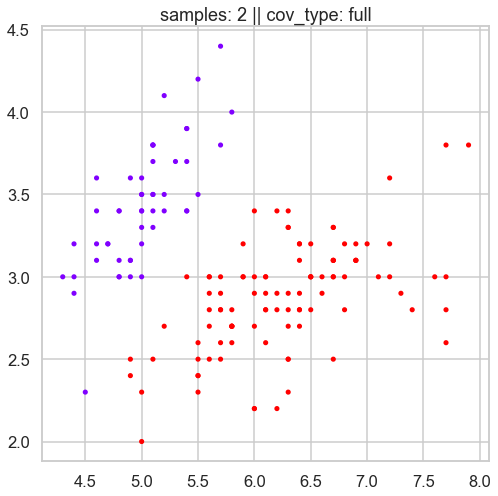

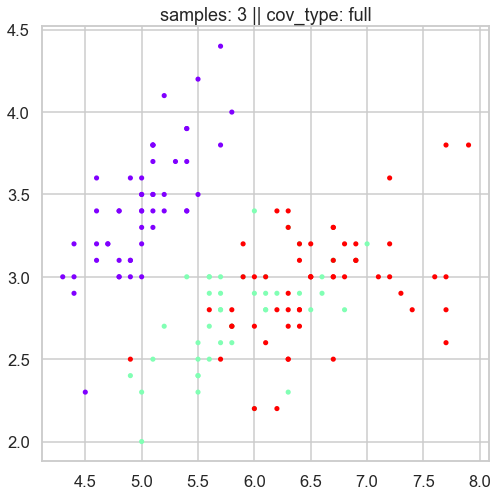

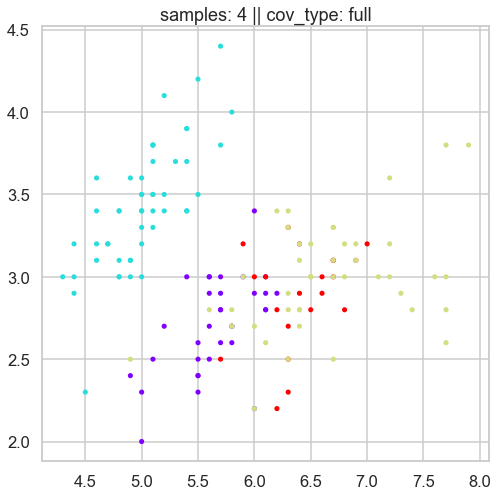

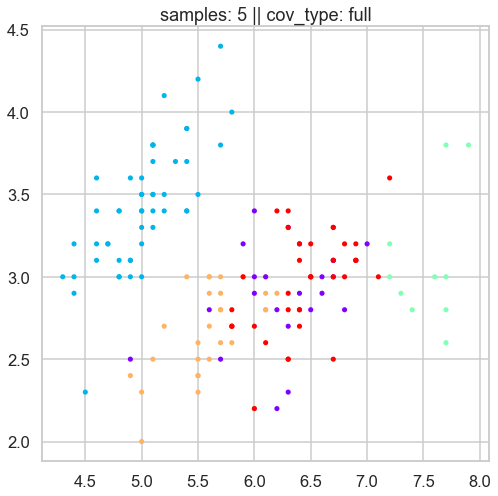

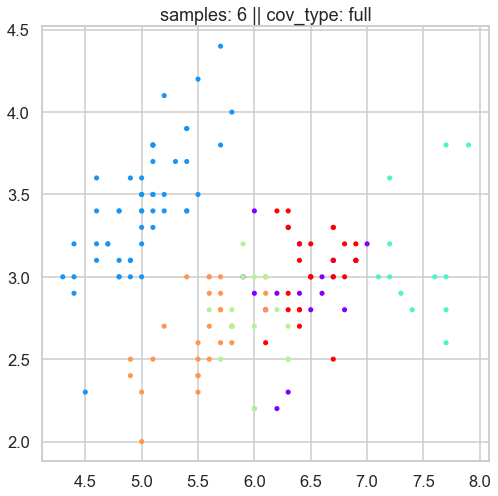

...

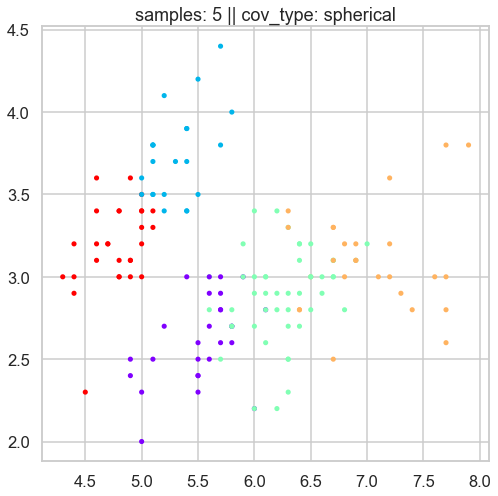

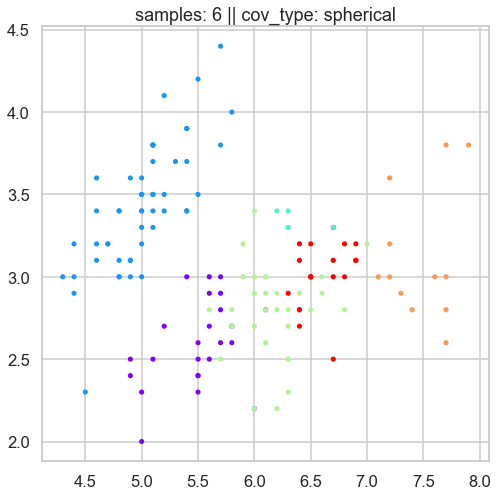

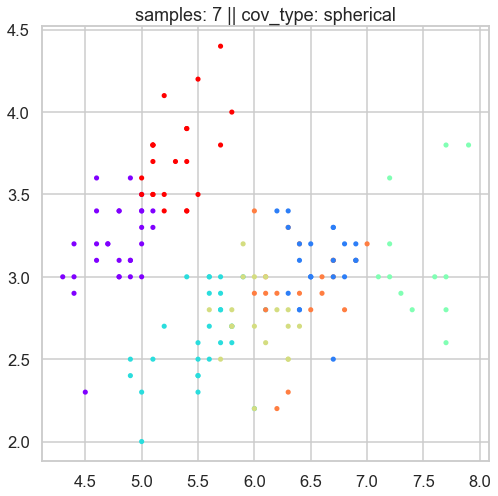

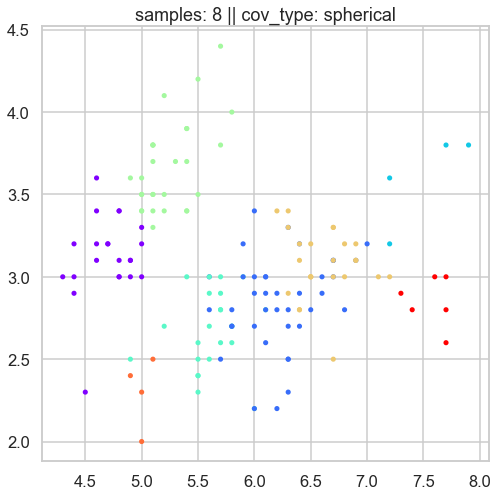

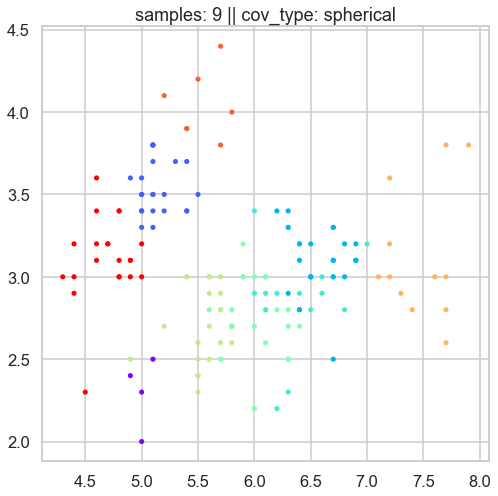

In [93]:
from matplotlib.colors import LogNorm
cov_types_iris = ['full','tied','diag','spherical']
listofsamples_iris=[2,3,4,5,6,7,8,9]
listofcov_iris=[]
for i in cov_types_iris:
    for j in listofsamples_iris:
        gm_iris=GaussianMixture(n_components=j,covariance_type=i).fit(arr_df)
        probs_iris=gm_iris.predict_proba(arr_df)
        listofcov_iris.append(probs_iris)
        plt.scatter(arr_df[:,0], arr_df[:,1], c = gm_iris.predict(arr_df), cmap ='rainbow',s =13)
        plt.title("samples: {} || cov_type: {}".format(gm_iris.n_components,gm_iris.covariance_type))
        plt.show()
        



# NORMALIZING THE IRIS DATA SET

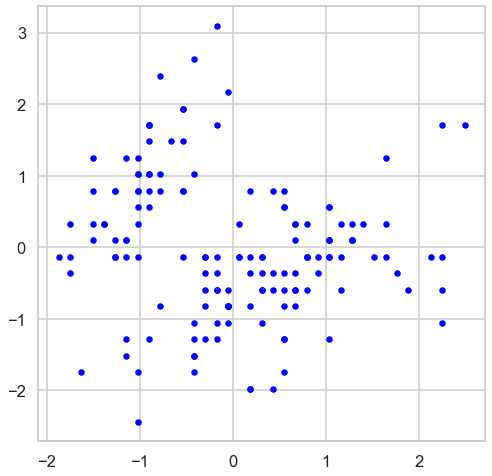

In [33]:
sc = StandardScaler()
arr_df_scaled = sc.fit_transform(arr_df)
plt.scatter(arr_df_scaled[:,0], arr_df_scaled[:,1], c ='b',s=25)


# kmeans for normalized iris data set

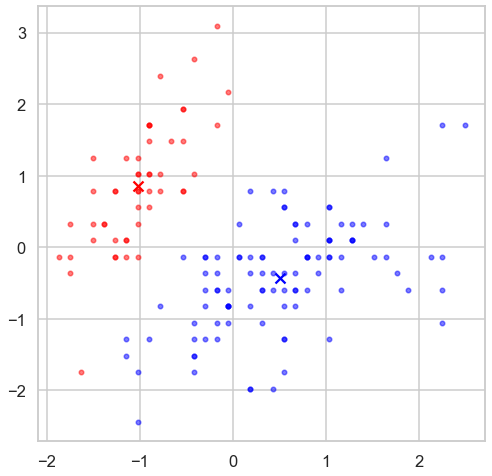

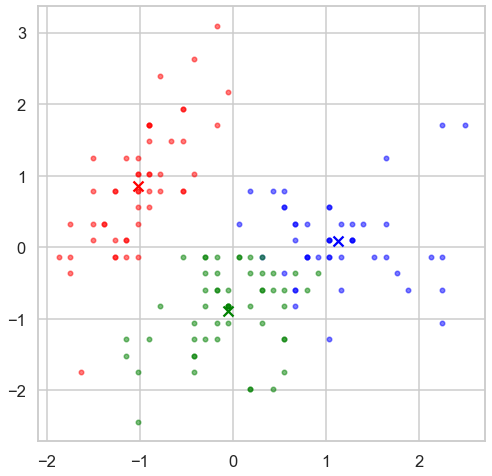

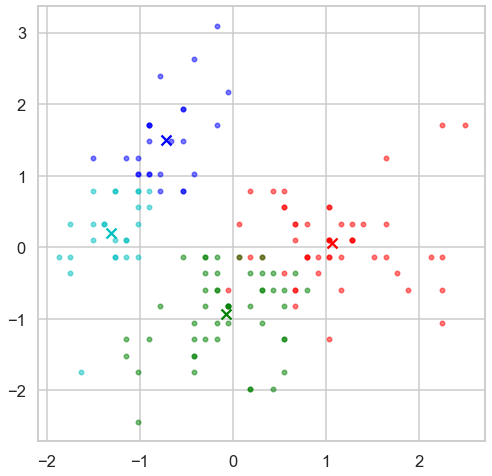

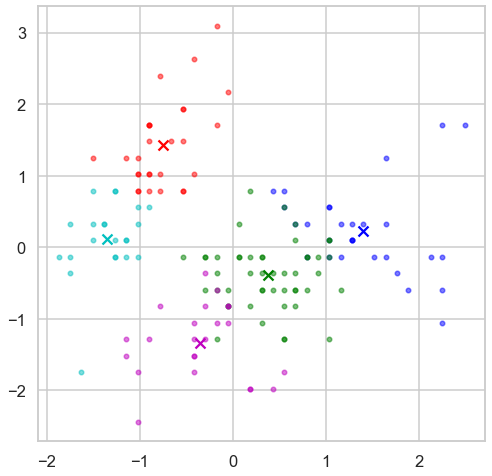

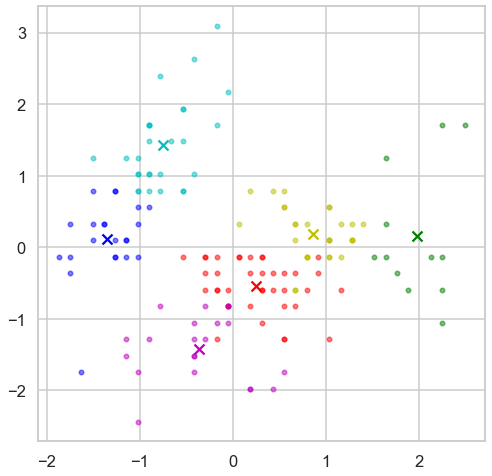

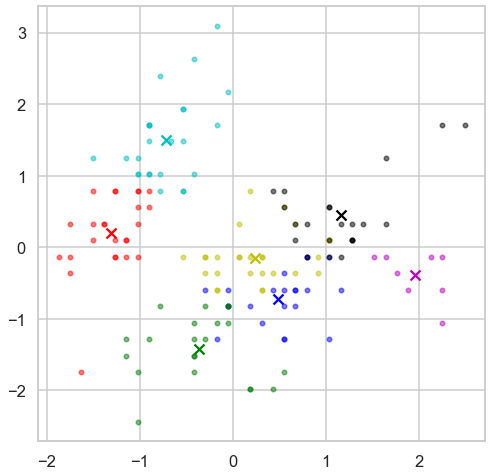

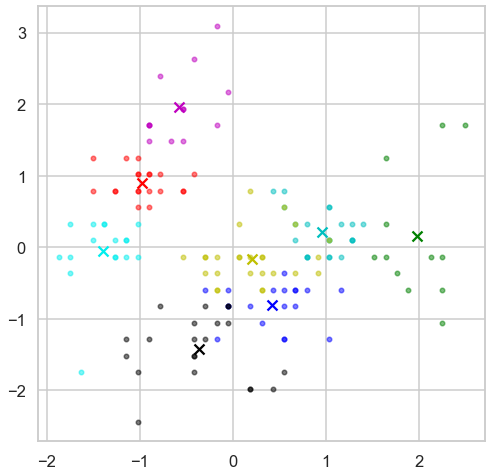

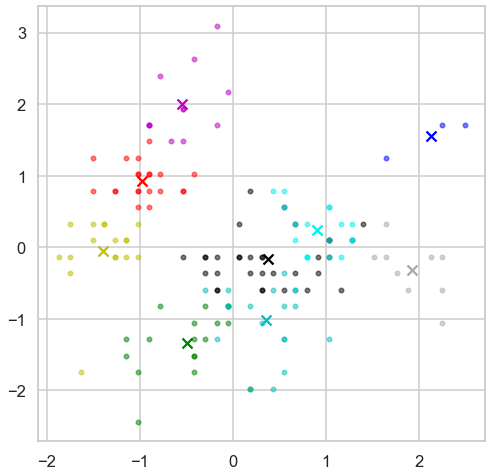

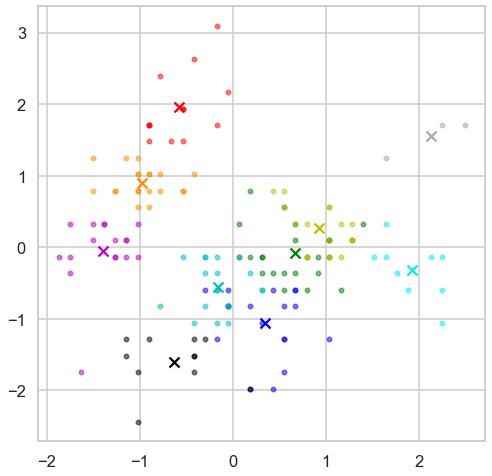

In [34]:
listofk=[2,3,4,5,6,7,8,9,10]
for i in listofk:
    kmeansfunc(arr_df_scaled,i)
     

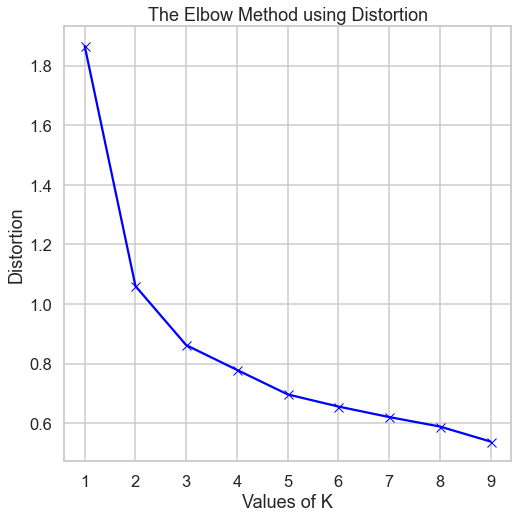

In [35]:
elbow_K(arr_df_scaled)

10


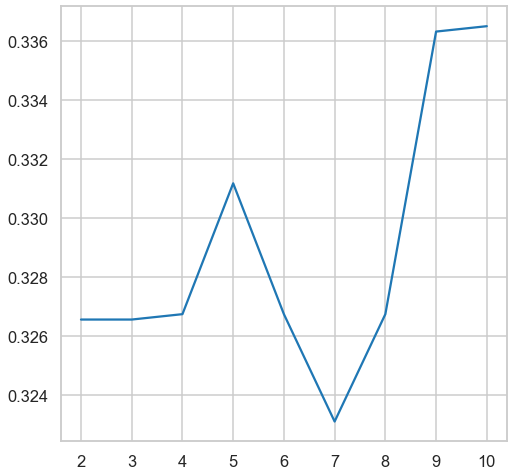

In [36]:
k_scaled=2
list_iris_scaled=[]

while(k_scaled<=10):
    kmeans_iris_scaled = KMeans(n_clusters=k_scaled)
    km_iris_scaled=kmeans.fit(arr_df_scaled)
    silhouette_avg_iris_scaled = silhouette_score(arr_df_scaled,km_iris_scaled.labels_)
    list_iris_scaled.append(silhouette_avg_iris_scaled)
    k_scaled=k_scaled+1
z_iris_scaled=[2,3,4,5,6,7,8,9,10]
plt.figure
plt.plot(z_iris_scaled,list_iris_scaled)
print(z_iris_scaled[np.argmax(list_iris_scaled)])

# HIRCHERY FOR IRIS SCALED

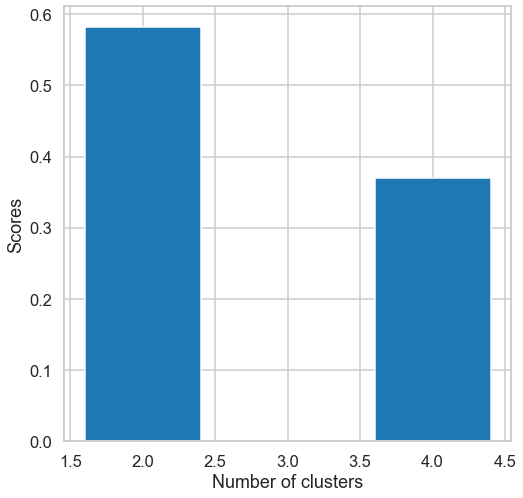

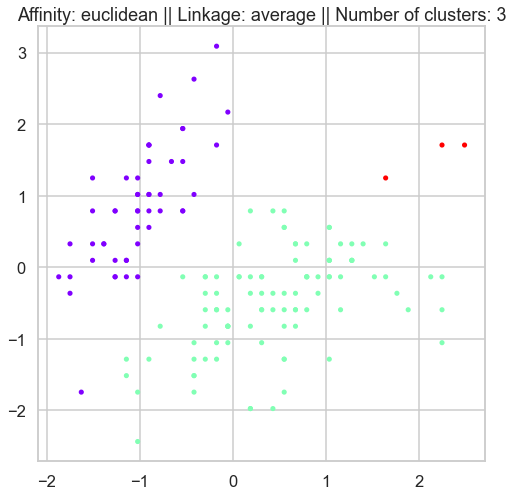

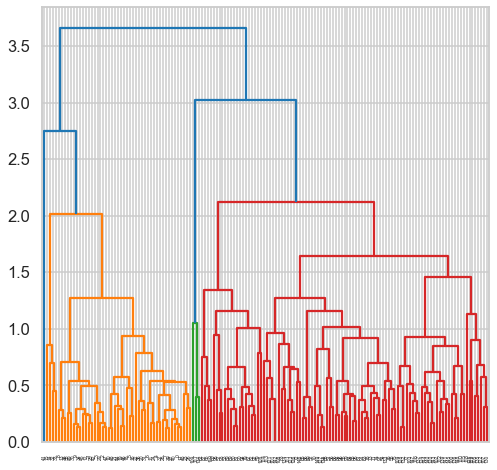

0.5817500491982808


In [37]:
listofaffinity_iris_scaled=['euclidean','manhattan','cosine']
listoflinkage_iris_scaled=['average','single']
listn_cluser_iris_scaled=[]
silhouette_scores_iris_scaled= []
listofcombination_iris_scaled=[]
for i in listofaffinity_iris_scaled:
    for j in listoflinkage_iris_scaled:
        agglo_iris_scaled=AgglomerativeClustering(n_clusters =None,affinity=i,linkage=j,distance_threshold = 3, compute_full_tree =True).fit(arr_df)
        listn_cluser_iris_scaled.append(agglo_iris_scaled.n_clusters_)
        listn_cluser_iris_scaled.sort()
        
        while (listn_cluser_iris_scaled.count(1)):
            listn_cluser_iris_scaled.remove(1)

        if len(np.unique(agglo_iris_scaled.labels_))>1:
            silhouette_scores_iris_scaled.append(silhouette_score(arr_df_scaled, agglo_iris_scaled.labels_))
            listofcombination_iris_scaled.append([agglo_iris_scaled.affinity,agglo_iris_scaled.linkage])
            
       


#         plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = agglo.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))
#         plt.show()

#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))

#         dindo=shc.linkage(Multi_blob_Data,j)
#         shc.dendrogram(dindo)
#         plt.show()
        
    

plt.bar(listn_cluser_iris_scaled, silhouette_scores_iris_scaled)
plt.xlabel('Number of clusters')
plt.ylabel('Scores')
plt.show()
x_iris_scaled=np.argmax(silhouette_scores_iris_scaled)
bestcombinantion_iris_scaled=listofcombination_iris_scaled[x_iris_scaled]
agglo_best_iris_scaled=AgglomerativeClustering(n_clusters =None,affinity=bestcombinantion_iris_scaled[0],linkage=bestcombinantion_iris_scaled[1],distance_threshold = 3, compute_full_tree =True).fit(arr_df_scaled)
plt.scatter(arr_df_scaled[:,0], arr_df_scaled[:,1], c = agglo_best_iris_scaled.fit_predict(arr_df_scaled), cmap ='rainbow',s =13)
plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo_best_iris_scaled.affinity,agglo_best_iris_scaled.linkage,agglo_best_iris_scaled.n_clusters_))
plt.show()
plt.figure()
dindo_iris_scaled=shc.linkage(arr_df_scaled,agglo_best_iris_scaled.linkage)
shc.dendrogram(dindo_iris_scaled)
plt.show()
max_score_iris_scaled=max(silhouette_scores_iris_scaled)
print(max_score_iris_scaled)

# dbscan for iris data set scaled

[1.4000000000000001, 5]


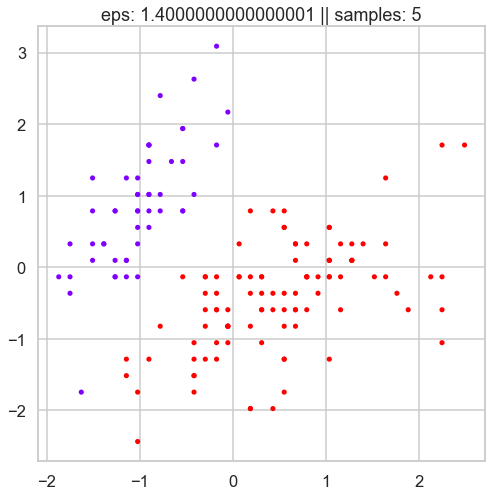

0.5817500491982808


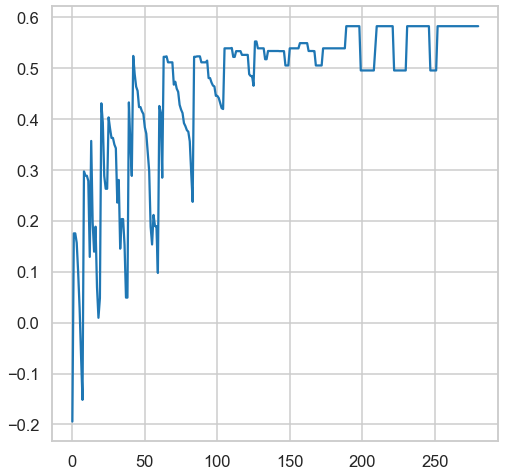

In [38]:
listofeps_iris_scaled=np.arange(0.1,3.1,0.1)
listofsamp_iris_scaled=np.arange(5,26,1)
silhouette_scores_iris_db_scaled= []
list_iris_db_scaled=[]
listofcombination_iris_db_scaled=[]
for i in listofeps_iris_scaled:
    for j in listofsamp_iris_scaled:
        db_iris_scaled=DBSCAN(eps=i, min_samples=j).fit(arr_df_scaled)
        labels_iris_scaled = db_iris_scaled.labels_
        n_clusters__iris_scaled = len(set(labels_iris_scaled)) - (1 if -1 in labels_iris_scaled else 0)
        list_iris_db_scaled.append(n_clusters__iris_scaled)
        if len(np.unique(labels_iris_scaled))>1:
            silhouette_scores_iris_db_scaled.append(silhouette_score(arr_df_scaled,db_iris_scaled.labels_))
            listofcombination_iris_db_scaled.append([i,j])  
        
        
        


# print(len(listofcombination))
# print(len(silhouette_scores))
x_iris_db_scaled=np.argmax(silhouette_scores_iris_db_scaled)
bestcombinantion_iris_db_scaled=listofcombination_iris_db_scaled[x_iris_db_scaled]
print(bestcombinantion_iris_db_scaled)
db_best_iris_scaled=DBSCAN(eps=bestcombinantion_iris_db_scaled[0], min_samples=bestcombinantion_iris_db_scaled[1]).fit(arr_df_scaled)
plt.scatter(arr_df_scaled[:,0], arr_df_scaled[:,1], c = db_best_iris_scaled.labels_, cmap ='rainbow',s =13)
plt.title("eps: {} || samples: {}".format(db_best_iris_scaled.eps,db_best_iris_scaled.min_samples))
plt.show()
plt.figure
plt.plot(range(0,len(silhouette_scores_iris_db_scaled)),silhouette_scores_iris_db_scaled)
max_score_db_iris_scaled=max(silhouette_scores_iris_db_scaled)
print(max_score_db_iris_scaled)

# GUASSIAN MIXUTER FOR SCALED DATA

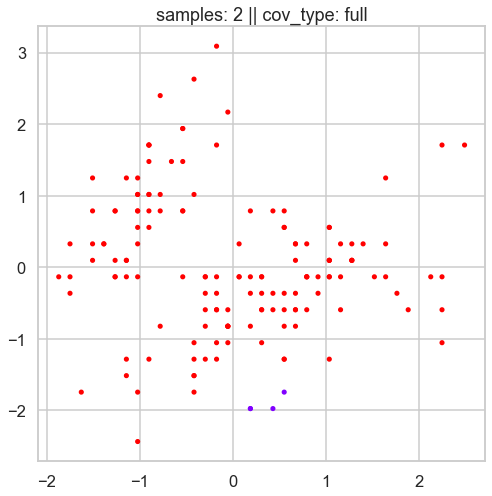

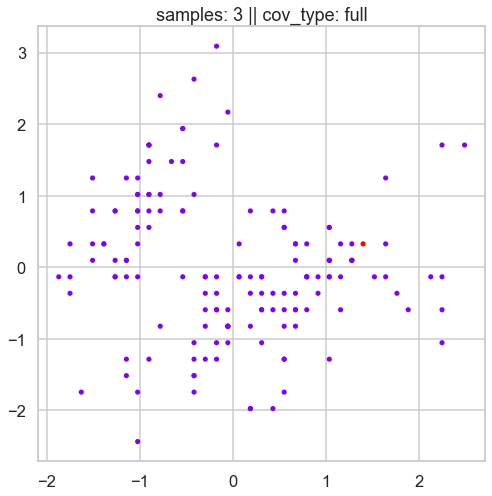

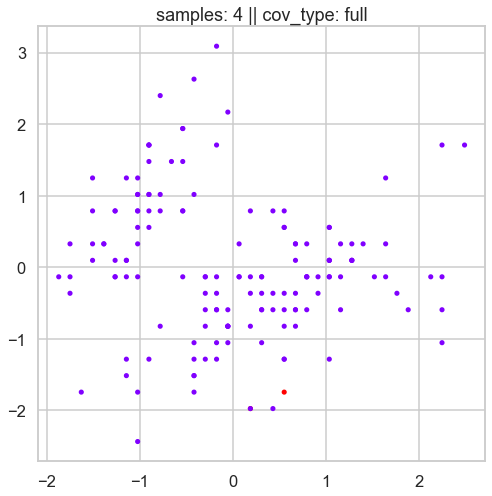

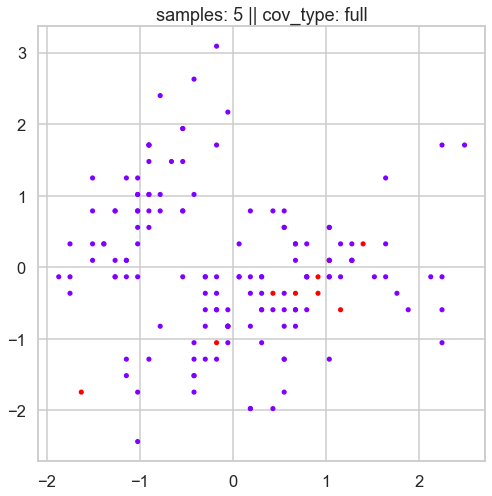

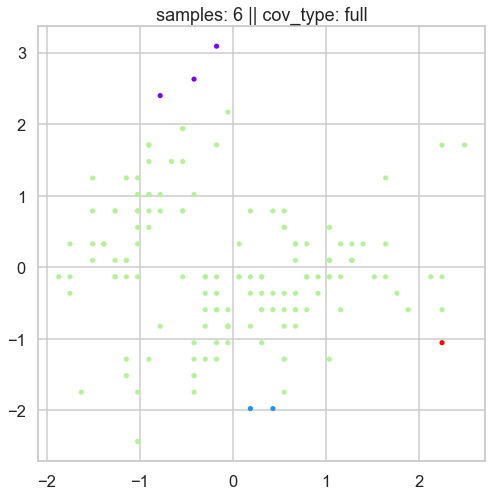

...

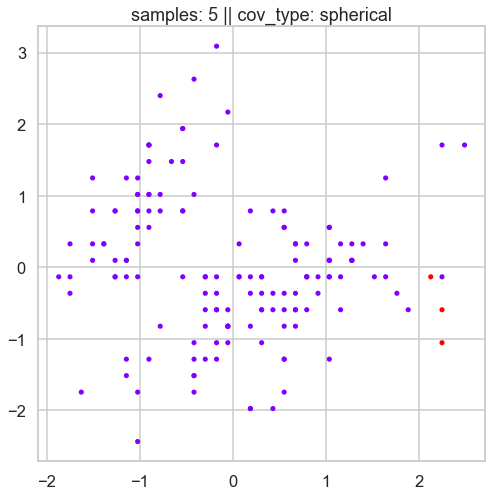

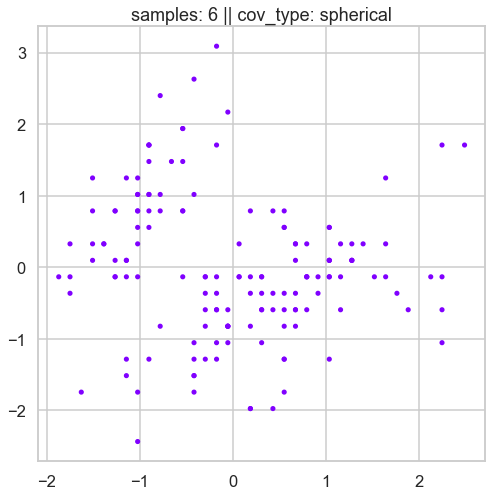

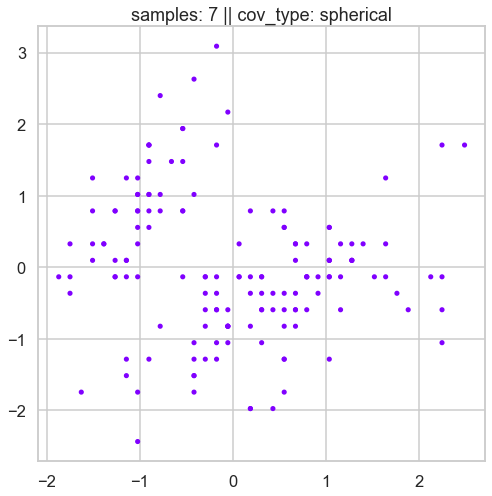

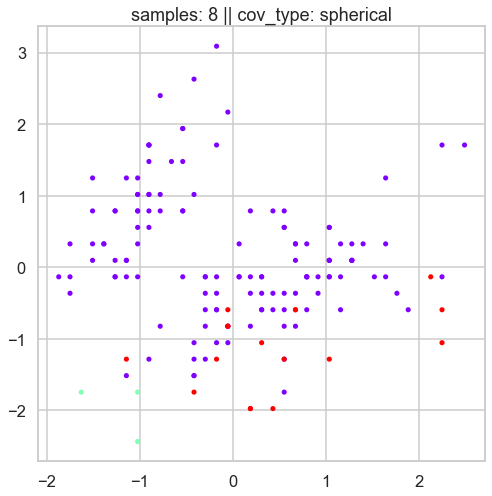

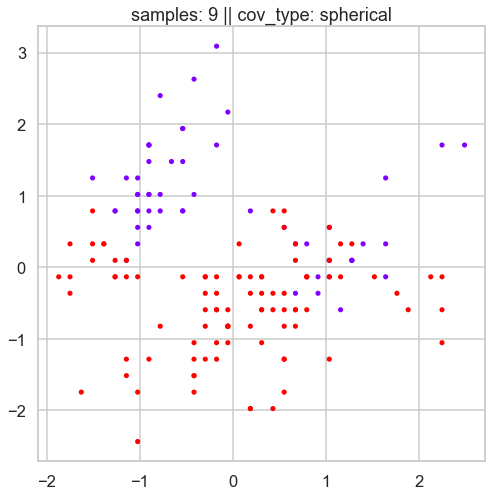

In [94]:
from matplotlib.colors import LogNorm
cov_types_iris_scaled = ['full','tied','diag','spherical']
listofsamples_iris_scaled=[2,3,4,5,6,7,8,9]
listofcov_iris_scaled=[]
for i in cov_types_iris_scaled:
    for j in listofsamples_iris_scaled:
        gm_iris_scaled=GaussianMixture(n_components=j,covariance_type=i).fit(arr_df)
        probs_iris_scaled=gm_iris_scaled.predict_proba(arr_df_scaled)
        listofcov_iris_scaled.append(probs_iris_scaled)
        plt.scatter(arr_df_scaled[:,0], arr_df_scaled[:,1], c = gm_iris_scaled.predict(arr_df_scaled), cmap ='rainbow',s =13)
        plt.title("samples: {} || cov_type: {}".format(gm_iris_scaled.n_components,gm_iris_scaled.covariance_type))
        plt.show()
        



* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

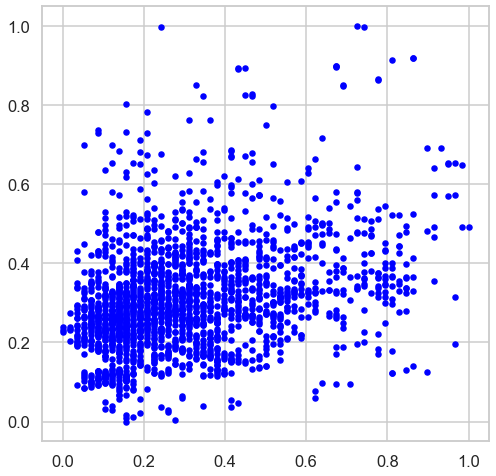

In [40]:
df_customer = pd.read_csv('Customer data.csv',usecols = ['Age','Income'])
sc = MinMaxScaler()
df_customer_scaled = sc.fit_transform(df_customer)
plt.scatter(df_customer_scaled[:,0], df_customer_scaled[:,1], c ='b',s=25)


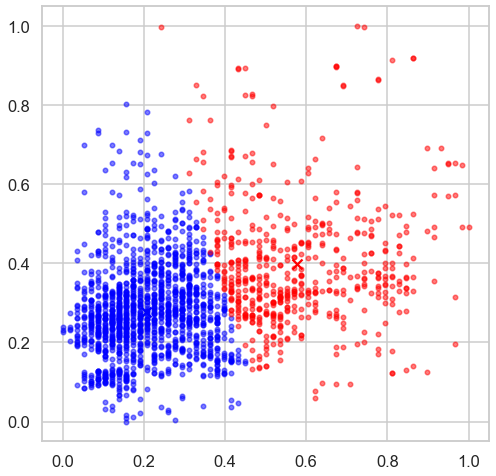

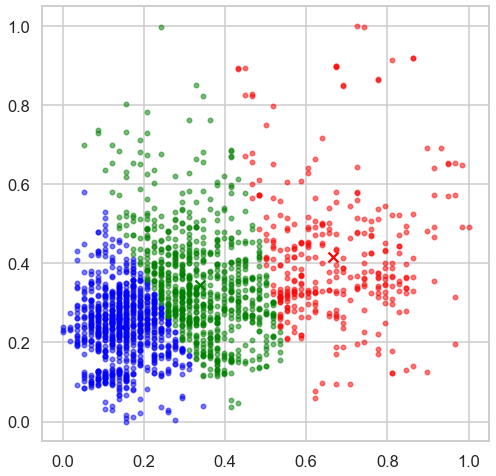

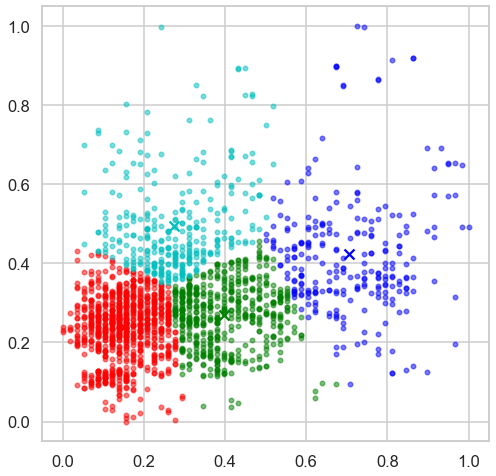

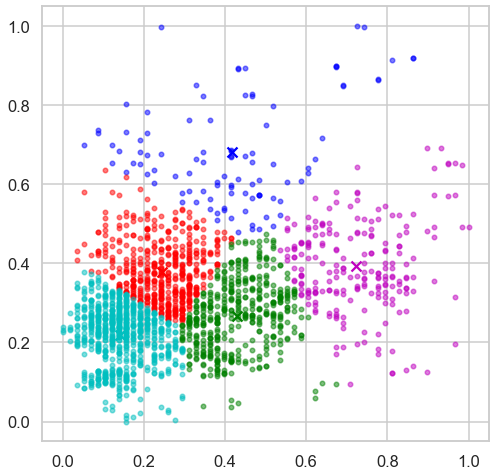

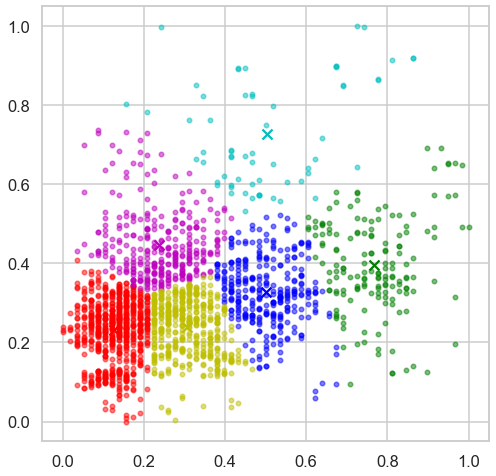

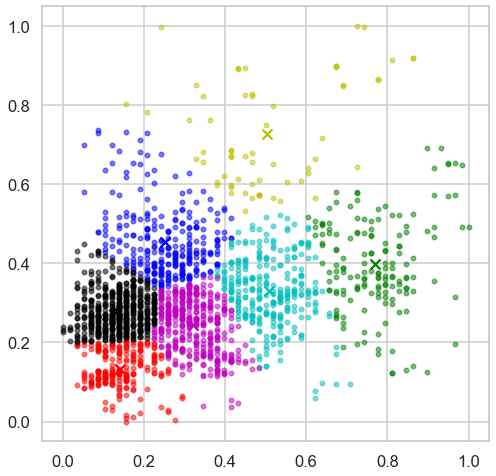

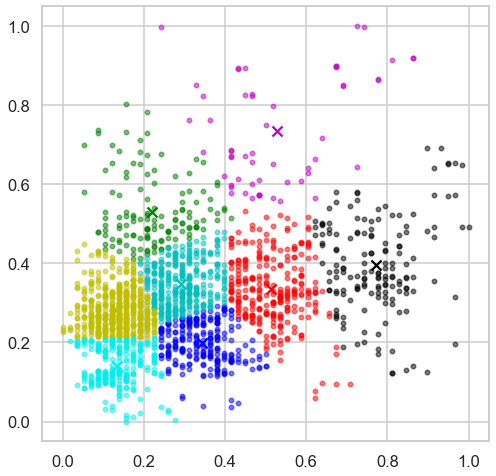

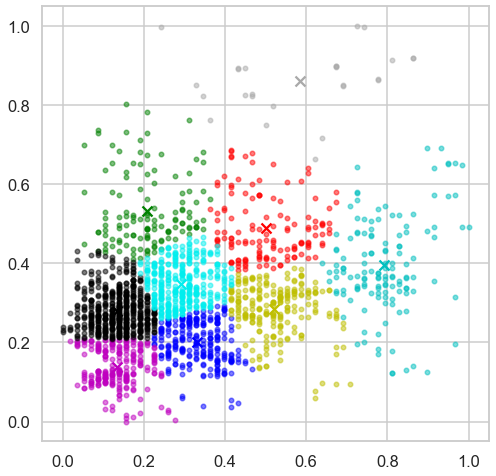

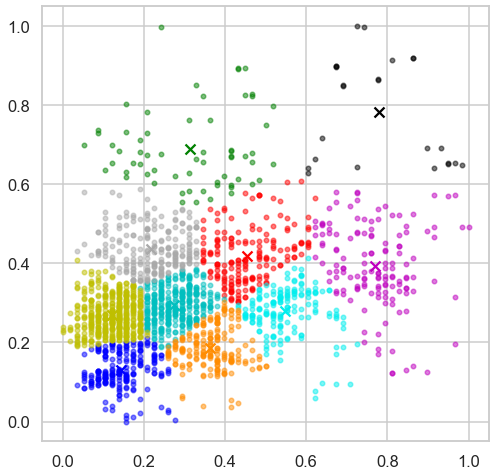

In [41]:
listofk=[2,3,4,5,6,7,8,9,10]
for i in listofk:
    kmeansfunc(df_customer_scaled,i)

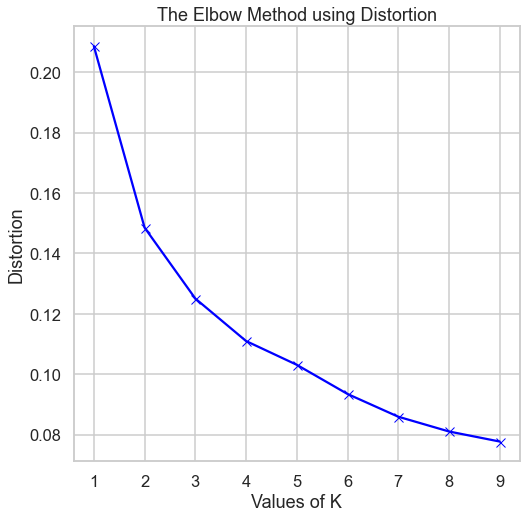

In [42]:
elbow_K(df_customer_scaled)

6


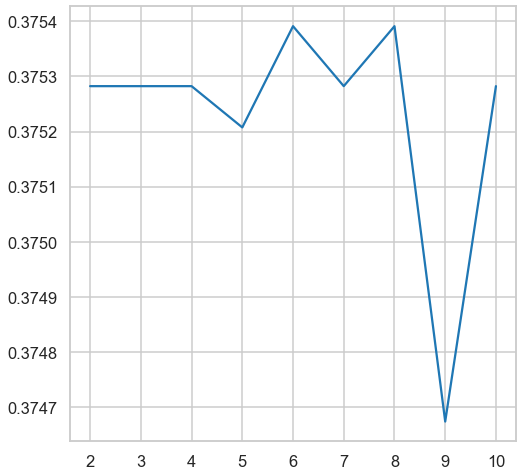

In [52]:
k_customer_scaled=2
list_customer_scaled=[]

while(k_customer_scaled<=10):
    kmeans_customer_scaled = KMeans(n_clusters=k_customer_scaled)
    km_customer_scaled=kmeans.fit(df_customer_scaled)
    silhouette_avg_customer_scaled = silhouette_score(df_customer_scaled,km_customer_scaled.labels_)
    list_customer_scaled.append(silhouette_avg_customer_scaled)
    k_customer_scaled=k_customer_scaled+1
z_customer_scaled=[2,3,4,5,6,7,8,9,10]
plt.figure
plt.plot(z_customer_scaled,list_customer_scaled)
print(z_customer_scaled[np.argmax(list_customer_scaled)])

# The hirchary fo the customer data set

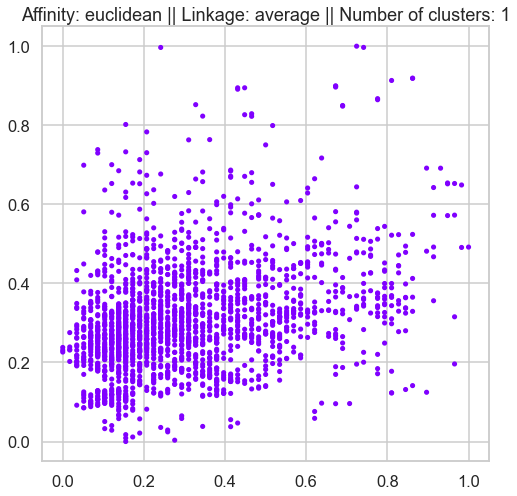

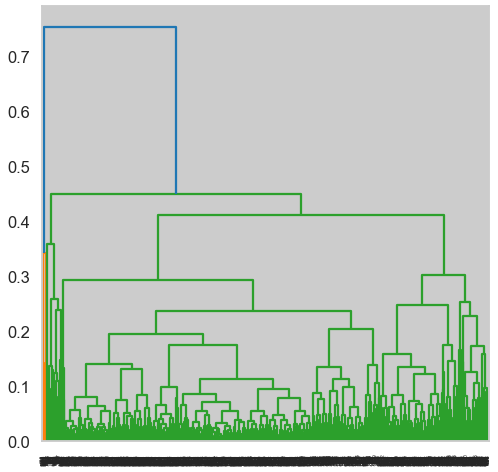

In [80]:
listofaffinity_cust=['euclidean','manhattan','cosine']
listoflinkage_cust=['average','single']
listn_cluser_cust=[]
silhouette_scores_cust= []
listofcombination_cust=[]
for i in listofaffinity_cust:
    for j in listoflinkage_cust:
        agglo_cust=AgglomerativeClustering(n_clusters= None ,affinity=i,linkage=j,distance_threshold=0.3, compute_full_tree =True).fit(df_customer_scaled)
        listn_cluser_cust.append(agglo_cust.n_clusters_)
        listn_cluser_cust.sort()
        
        while (listn_cluser_cust.count(1)):
            listn_cluser_cust.remove(1)

        if len(np.unique(agglo_cust.labels_))>1:
            silhouette_scores_cust.append(silhouette_score(df_customer_scaled, agglo_cust.labels_))
            listofcombination_cust.append([agglo_cust.affinity,agglo_cust.linkage])

            
            
       


#         plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c = agglo.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))
#         plt.show()

#         plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo.affinity,agglo.linkage,agglo.n_clusters_))

#         dindo=shc.linkage(Multi_blob_Data,j)
#         shc.dendrogram(dindo)
#         plt.show()
        
    

plt.show()
x_cust=np.argmax(silhouette_scores_cust)
bestcombinantion_cust=listofcombination_cust[x_cust]
agglo_best_cust=AgglomerativeClustering(n_clusters =None,affinity=bestcombinantion_cust[0],linkage=bestcombinantion_cust[1],distance_threshold = 3, compute_full_tree =True).fit(df_customer_scaled)
plt.scatter(df_customer_scaled[:,0], df_customer_scaled[:,1], c = agglo_best_cust.fit_predict(df_customer_scaled), cmap ='rainbow',s =13)
plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(agglo_best_cust.affinity,agglo_best_cust.linkage,agglo_best_cust.n_clusters_))
plt.show()
plt.figure()
dindo_cust=shc.linkage(df_customer_scaled,agglo_best_cust.linkage)
shc.dendrogram(dindo_cust)
plt.show()


[0.2, 16]


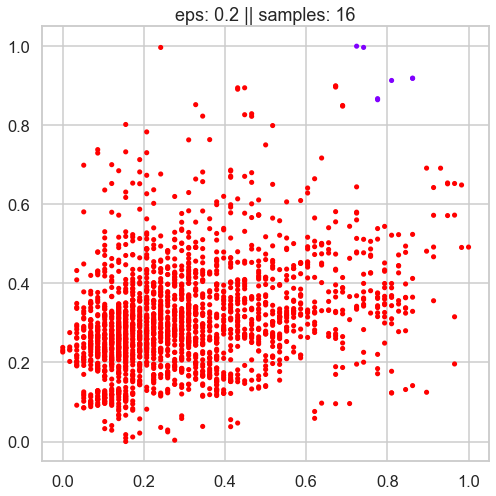

0.6058933409017604


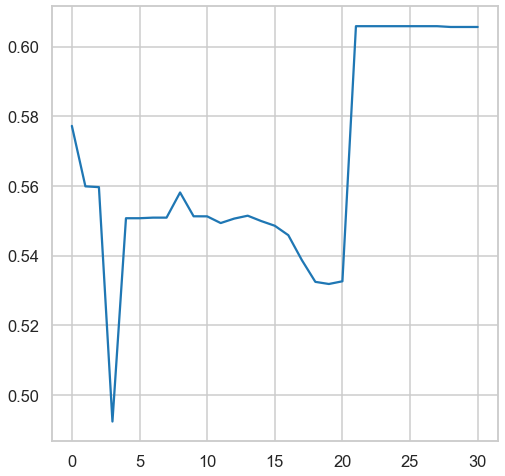

In [81]:
listofeps_cust_scaled=np.arange(0.1,3.1,0.1)
listofsamp_cust_scaled=np.arange(5,26,1)
silhouette_scores_cust_db_scaled= []
list_cust_db_scaled=[]
listofcombination_cust_db_scaled=[]
for i in listofeps_cust_scaled:
    for j in listofsamp_cust_scaled:
        db_cust_scaled=DBSCAN(eps=i, min_samples=j).fit(df_customer_scaled)
        labels_cust_scaled = db_cust_scaled.labels_
        n_clusters__cust_scaled = len(set(labels_cust_scaled)) - (1 if -1 in labels_cust_scaled else 0)
        list_cust_db_scaled.append(n_clusters__cust_scaled)
        if len(np.unique(labels_cust_scaled))>1:
            silhouette_scores_cust_db_scaled.append(silhouette_score(df_customer_scaled,db_cust_scaled.labels_))
            listofcombination_cust_db_scaled.append([i,j])  
        
        
        


# print(len(listofcombination))
# print(len(silhouette_scores))
x_cust_db_scaled=np.argmax(silhouette_scores_cust_db_scaled)
bestcombinantion_cust_db_scaled=listofcombination_cust_db_scaled[x_cust_db_scaled]
print(bestcombinantion_cust_db_scaled)
db_best_cust_scaled=DBSCAN(eps=bestcombinantion_cust_db_scaled[0], min_samples=bestcombinantion_cust_db_scaled[1]).fit(df_customer_scaled)
plt.scatter(df_customer_scaled[:,0],df_customer_scaled[:,1], c = db_best_cust_scaled.labels_, cmap ='rainbow',s =13)
plt.title("eps: {} || samples: {}".format(db_best_cust_scaled.eps,db_best_cust_scaled.min_samples))
plt.show()
plt.figure
plt.plot(range(0,len(silhouette_scores_cust_db_scaled)),silhouette_scores_cust_db_scaled)
max_score_db_cust_scaled=max(silhouette_scores_cust_db_scaled)
print(max_score_db_cust_scaled)

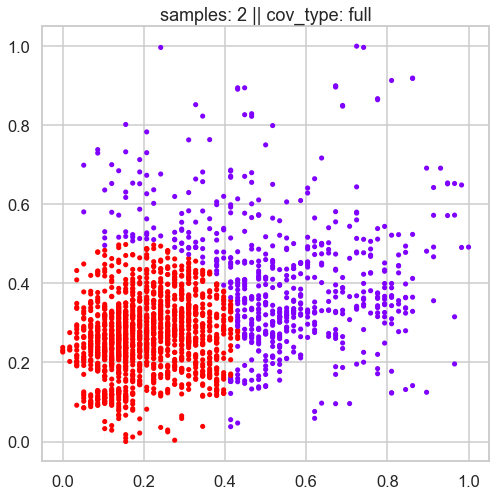

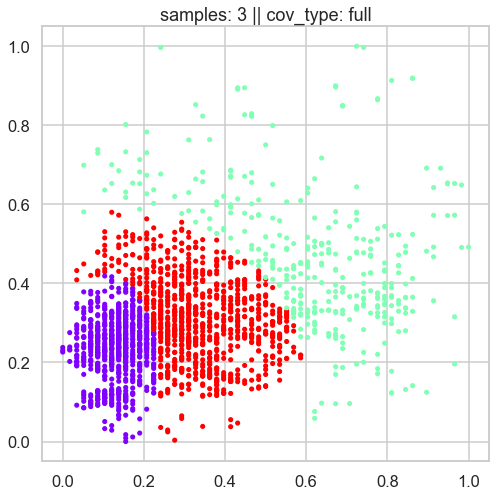

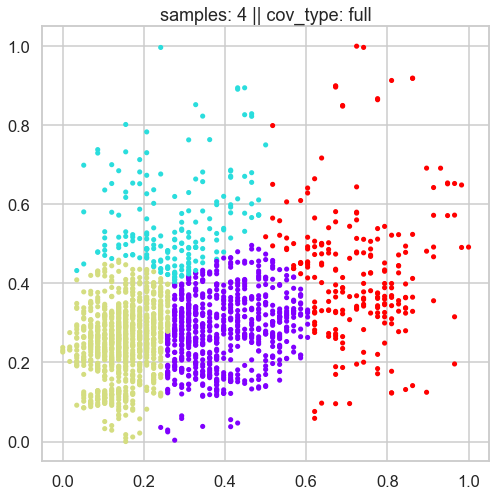

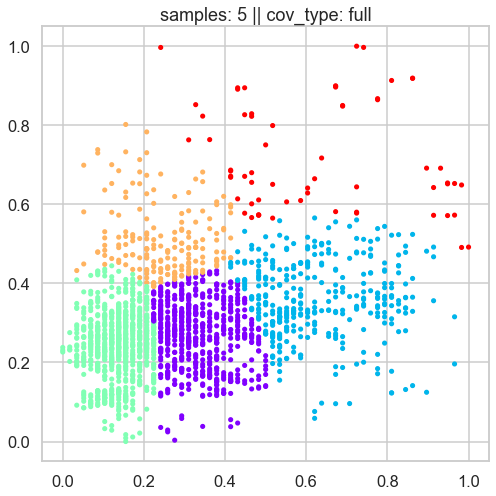

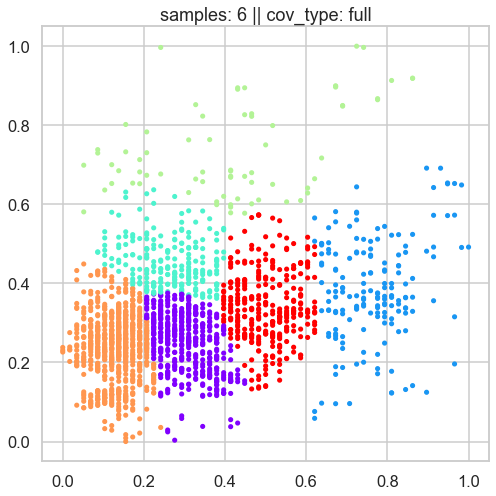

...

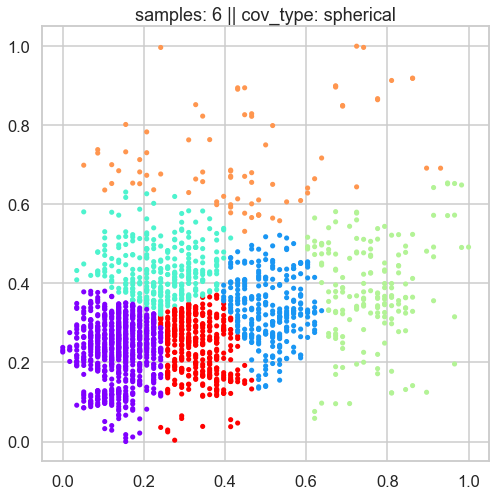

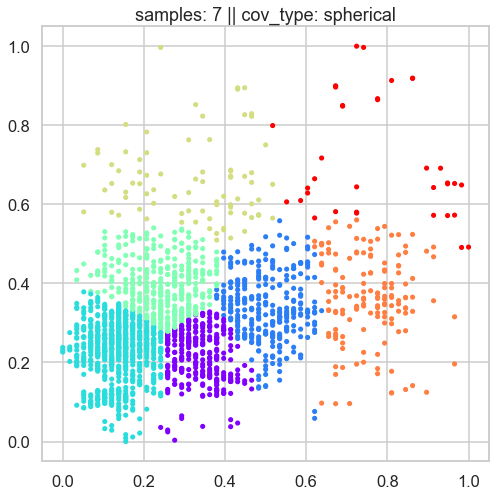

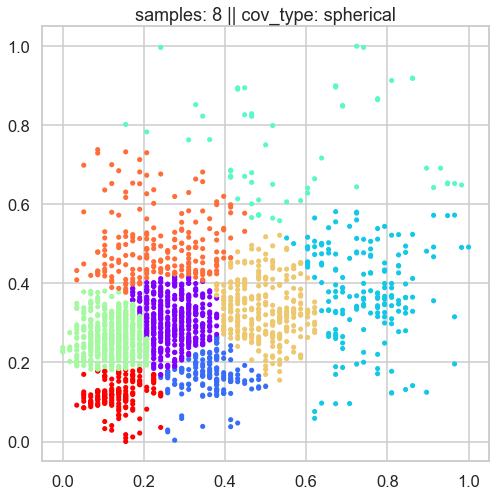

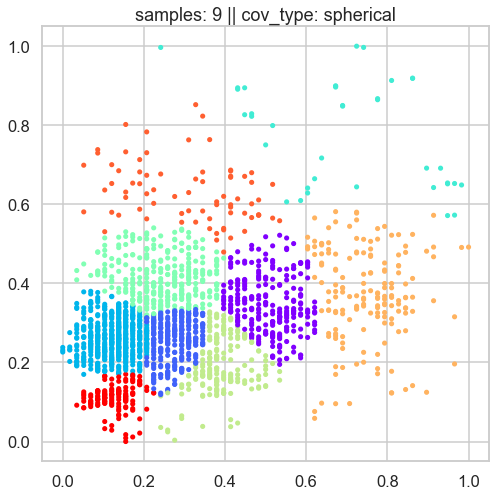

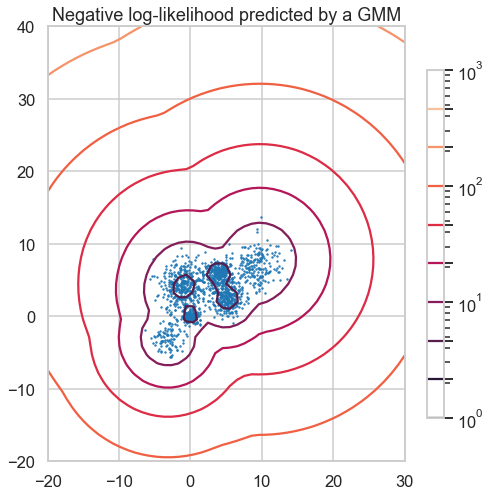

In [82]:
from matplotlib.colors import LogNorm
cov_types_cust = ['full','tied','diag','spherical']
listofsamples_cust=[2,3,4,5,6,7,8,9]
listofcov_cust=[]
for i in cov_types_cust:
    for j in listofsamples_cust:
        gm_cust=GaussianMixture(n_components=j,covariance_type=i).fit(df_customer_scaled)
        probs_cust=gm_cust.predict_proba(df_customer_scaled)
        listofcov_cust.append(probs_cust)
        plt.scatter(df_customer_scaled[:,0], df_customer_scaled[:,1], c = gm_cust.predict(df_customer_scaled), cmap ='rainbow',s =13)
        plt.title("samples: {} || cov_type: {}".format(gm_cust.n_components,gm_cust.covariance_type))
        plt.show()
        

x = np.linspace(-20.0, 30.0)
y = np.linspace(-20.0, 40.0)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -gm.score_samples(XX)
Z = Z.reshape(X.shape)

CS = plt.contour(
    X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10)
)
CB = plt.colorbar(CS, shrink=0.8, extend="both")
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], 0.8)

plt.title("Negative log-likelihood predicted by a GMM")
plt.axis("tight")
plt.show()